In [1]:
%run neural_simulation_functions.ipynb

In [2]:
#import the python file
# once everything is good run this

#from neural_simulation_functions import *

Parameters.

In [4]:
num_neurons = 10 # try 10 just to see covariance matrices
rate = 10 
rates = np.linspace(5, 15, num_neurons)
time = 1000
num_samples = 100 # change to 100 to show Alex next time, but plot the first five trajectories or random five 
t0 = 200
time_points = np.arange(0, 1000)

In [5]:
# Simulation control parameters

# Network parameters
N_E = 1000
#gamma = 0.25                    # ratio of inhibitory to excitatory neurons
#N_I = round(gamma * N_E)
#N = N_E + N_I
epsilon = 0.5                   # Sparsity of connections.  changed from 0.1, 0.2 was fine...
#C_E = epsilon * N_E             # number of excitatory connections per neuron
#C_ext = C_E                     # external connections per neuron


# Neuron parameters
#tau = 20  * ms                  # Membrane time constant. previously 20, tried 50 it was weird, larger numbers more spikes, smaller numbers less spikes
                                # Higher Tau means slower decay, more spikes.
                                # Lower Tau means faster decay, fewer spikes
#theta = 20  * mV                # spike threshold voltage, neuron fires when hitting this value
#V_r = 10  * mV                  # reset potential, voltage neuron goes back to after firing
#tau_rp = 2  * ms                # refractory period (neuron needs to wait some time before spiking again)

# Synapse parameters
#J = 0.1 * mV                    # Synaptic strength # Previously 0.1 * mV, previouysly 0.075, 0.2 was too varied need to be more consistent
                                # larger J, stronger synaptic input, higher firing rate
                                # smaller J, weaker input, lower firing rates
#D = 1.5  * ms                   # synaptic delay, time between a pre spike and its effect on postsynap neuron

# Simulation settings
#dt = 0.1  * ms
g = 4                           # g is a good control for manipulating the firing rate, smaller numbers more spikes, bigger numbers less spikes
                                # Higher g, stronger inhibition, suppresses network activity
                                # Lower g, weaker inhibition, increase network activity
nu_ext_over_nu_thr = 1          # Previously 2, 1.2 was weird, 1 (made 2d plot nice), 0.5 not good,
# t_range = [1000, 1200]
# rate_range = [0, 200]
# rate_tick_step = 50

#nu_thr = theta / (J * C_E * tau) # minimal input rate needed to reach threshold
#nu_ext = nu_ext_over_nu_thr * nu_thr # external input rate

# adjust g and nu_ext so that nu_ext is approximately the number of spikes that are occuring, influenced by g. 
# epsilon 0.2 and g = 2.6, g = 2.8 is too much,tau = 50
# epsilon 0.5 and g = 4, tau = 20

Generating spike trains, then counting the spikes.

In [7]:
raw_spike_train = independent_poisson_processes(num_neurons, rate, time, num_samples)
# print(raw_spike_train)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([ 5.        ,  6.11111111,  7.22222222,  8.33333333,  9.44444444,
       10.55555556, 11.66666667, 12.77777778, 13.88888889, 15.        ]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [8]:
save_spike_trains(raw_spike_train, "spike_trains.json")
loaded_spike_trains = load_spike_trains("spike_trains.json")
# print(loaded_spike_trains)

Spike trains saved to spike_trains.json


In [9]:
spike_train = standardize_units(raw_spike_train)
# print(spike_train)

In [10]:
raw_multi_rate_spike_train = multivariate_constant_poisson(num_neurons, rates, time, num_samples)

In [11]:
save_spike_trains(raw_multi_rate_spike_train, "multi_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("multi_rate_spike_trains.json")

Spike trains saved to multi_rate_spike_trains.json


In [12]:
multi_rate_spike_train = standardize_units(raw_multi_rate_spike_train)

In [13]:
# first_spike = find_nth_earliest_spike(spike_train, n=2)

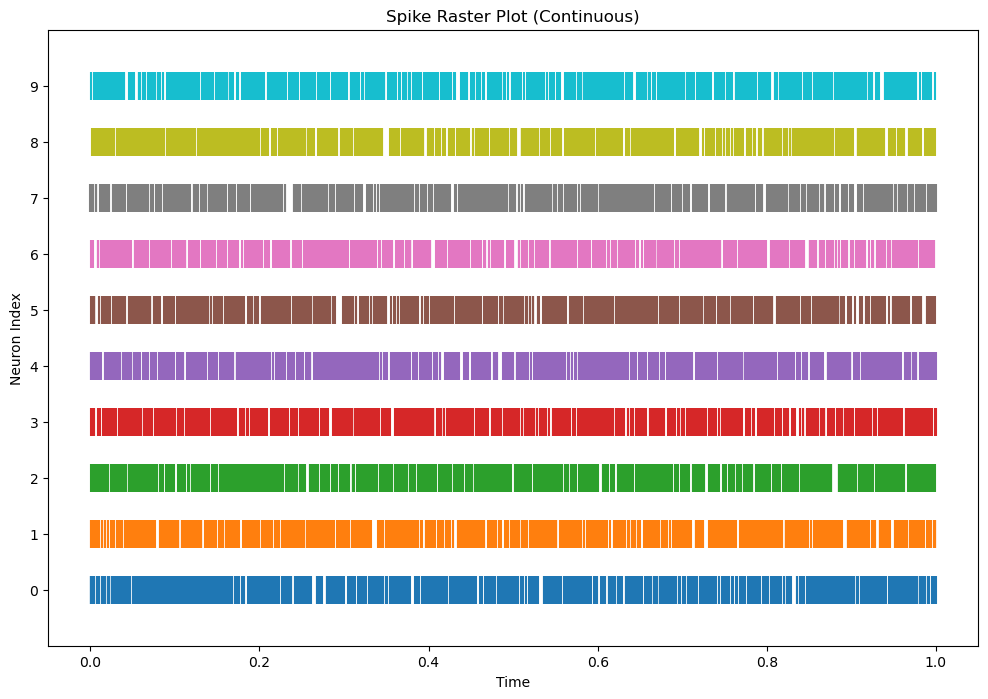

In [14]:
raster_plot(spike_train, colors=None, linelengths=None, figsize=(12,8))

In [15]:
binary_spikes = spikes_to_binary(spike_train, num_neurons, time)
multi_rate_binary_spikes = spikes_to_binary(multi_rate_spike_train, num_neurons, time)

In [16]:
spike_count = count_spikes(binary_spikes)
count = np.array(spike_count)
# print(count)
# print(count.shape)
multi_rate_spike_count = count_spikes(multi_rate_binary_spikes)
multi_rate_count = np.array(multi_rate_spike_count)

In [17]:
random_indices = np.random.choice(count.shape[0], size=5, replace=False)  # No duplicates
random_samples = count[random_indices]  # Shape: (5, neurons, time)

Getting spike trains from excitatory and inhibitory neurons, then counting the spikes.

In [19]:
# results = sim(params["g"], params["nu_ext_over_nu_thr"], params["t_range"][1] * ms, ax_spikes, ax_rates, params["rate_tick_step"], num_neurons, num_samples)
results = sim(N_E, epsilon, g, nu_ext_over_nu_thr, time, num_neurons, num_samples)

raw_excitatory_spike_trains = results['excitatory']['spike_trains']
raw_inhibitory_spike_trains = results['inhibitory']['spike_trains']
# print(raw_excitatory_spike_trains)

In [20]:
save_spike_trains(raw_excitatory_spike_trains, "spike_trains_ex.json")
loaded_spike_trains_ex = load_spike_trains("spike_trains_ex.json")

save_spike_trains(raw_inhibitory_spike_trains, "spike_trains_in.json")
loaded_spike_trains_in = load_spike_trains("spike_trains_in.json")

Spike trains saved to spike_trains_ex.json
Spike trains saved to spike_trains_in.json


In [21]:
excitatory_spike_trains = standardize_units(raw_excitatory_spike_trains)
inhibitory_spike_trains = standardize_units(raw_inhibitory_spike_trains)

#print(excitatory_spike_trains[0])
#print(inhibitory_spike_trains[0])

In [22]:
#first_spike_ex = find_nth_earliest_spike(excitatory_spike_trains, n=2)
#first_spike_in = find_nth_earliest_spike(inhibitory_spike_trains, n=2)

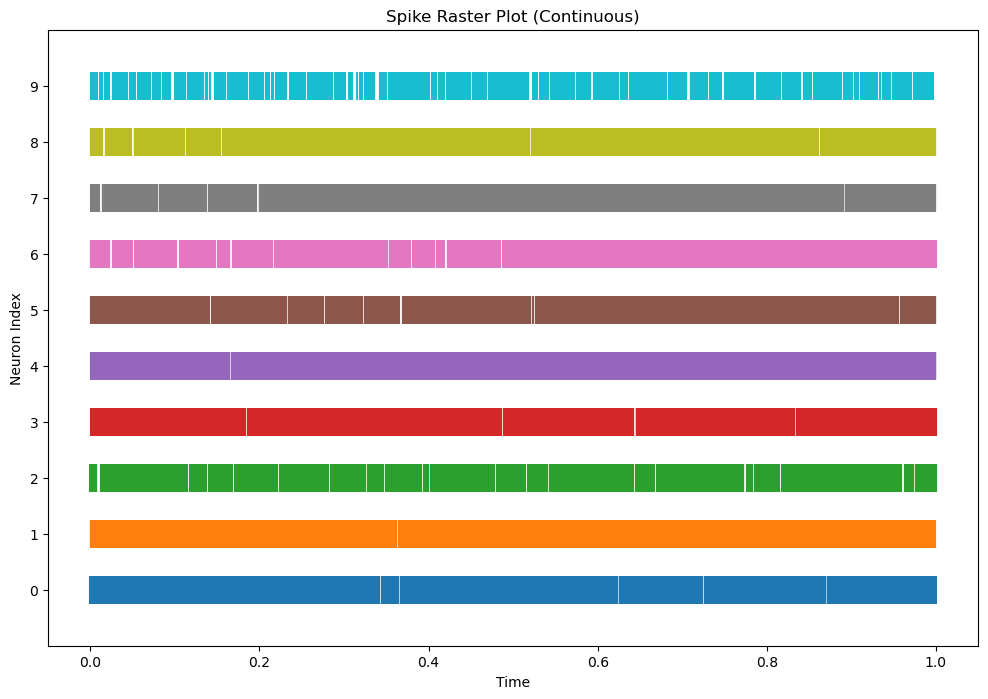

In [23]:
raster_plot(excitatory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

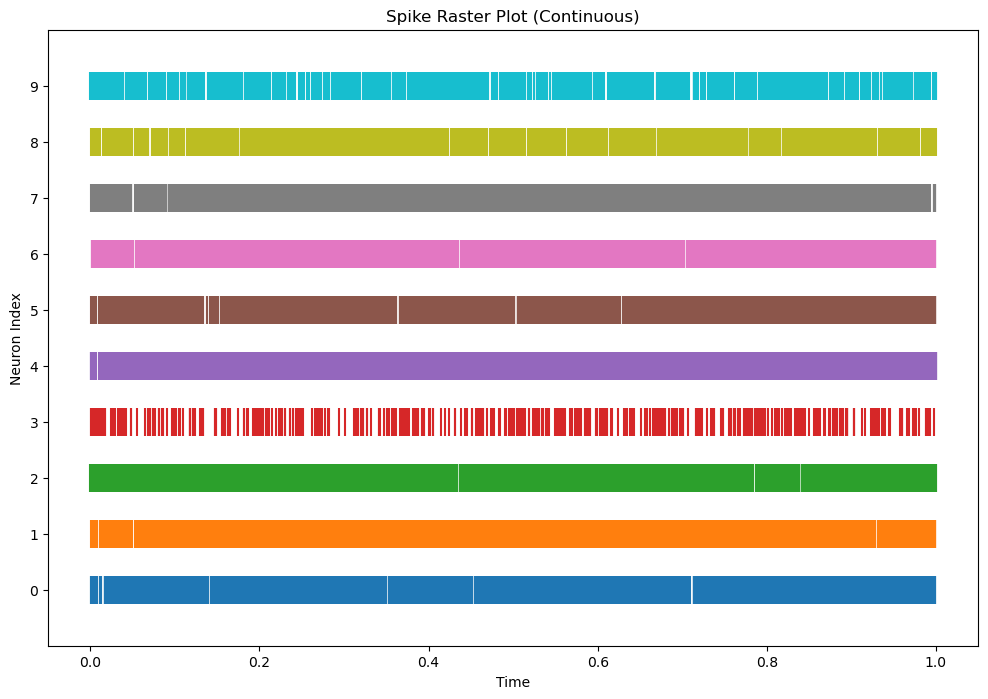

In [24]:
raster_plot(inhibitory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

In [25]:
binary_ex_spikes = spikes_to_binary(excitatory_spike_trains, num_neurons, time)
binary_in_spikes = spikes_to_binary(inhibitory_spike_trains, num_neurons, time)
# print(binary_ex_spikes[0][0]) # first sample of first neuron

In [26]:
spike_count_ex = count_spikes(binary_ex_spikes)
count_ex = np.array(spike_count_ex)
#print(spike_count_ex[0])
#print(count_ex[0])
#print(count_ex[1])
#print(count_ex.shape)

spike_count_in = count_spikes(binary_in_spikes)
count_in = np.array(spike_count_in)
#print(count_in.shape)

In [27]:
random_indices_ex = np.random.choice(count_ex.shape[0], size=5, replace=False)  # No duplicates
random_samples_ex = count_ex[random_indices_ex]  # Shape: (5, neurons, time)

random_indices_in = np.random.choice(count_in.shape[0], size=5, replace=False)  # No duplicates
random_samples_in = count_in[random_indices_in]  # Shape: (5, neurons, time)

Theoretical and Empirical stats of raw counts.

In [29]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
empirical_mean = count.mean(axis=0)
#print(empirical_mean.shape)
count_rate = empirical_mean[:, -1]
#print(count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
empirical_std_dev = np.sqrt(empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

empirical_lower_bound, empirical_upper_bound = confidence_intervals(empirical_mean, empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [30]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
multi_rate_empirical_mean = multi_rate_count.mean(axis=0)
#print(multi_rate_empirical_mean.shape)
multi_rate_count_rate = multi_rate_empirical_mean[:, -1]
#print(multi_rate_count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
multi_rate_empirical_std_dev = np.sqrt(multi_rate_empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

multi_rate_empirical_lower_bound, multi_rate_empirical_upper_bound = confidence_intervals(multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [31]:
exclude_times, global_exclude = last_zero_std_time(empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=0, recommended exclude=1
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=0, recommended exclude=1
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=0, recommended exclude=1
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [32]:
multi_rate_exclude_times, multi_rate_global_exclude = last_zero_std_time(multi_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=1, recommended exclude=2
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=1, recommended exclude=2
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=0, recommended exclude=1
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=0, recommended exclude=1

Global exclude (safest): t=2


In [33]:
theoretical_means = calculate_theoretical_mean(count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

theoretical_std_dev = calculate_theoretical_std_dev(theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

theoretical_lower_bound, theoretical_upper_bound = confidence_intervals(theoretical_means, theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [34]:
multi_rate_theoretical_means = calculate_theoretical_mean(multi_rate_count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

multi_rate_theoretical_std_dev = calculate_theoretical_std_dev(multi_rate_theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

multi_rate_theoretical_lower_bound, multi_rate_theoretical_upper_bound = confidence_intervals(multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [35]:
res_var = variance_of_residuals(empirical_mean, theoretical_means)
#print(res_var)

In [36]:
centers = center_counts_loop(count, theoretical_means, num_samples, num_neurons)

centers_mean = np.mean(centers, axis = 0)
centers_std_dev = np.std(centers, axis = 0, ddof = 1)

centers_emp = center_counts_loop(count, empirical_mean, num_samples, num_neurons)

centers_mean_emp = np.mean(centers_emp, axis = 0)
centers_std_dev_emp = np.std(centers_emp, axis = 0, ddof = 1)

In [37]:
multi_rate_centers = center_counts_loop(multi_rate_count, multi_rate_theoretical_means, num_samples, num_neurons)

multi_rate_centers_mean = np.mean(multi_rate_centers, axis = 0)
multi_rate_centers_std_dev = np.std(multi_rate_centers, axis = 0, ddof = 1)

multi_rate_centers_emp = center_counts_loop(multi_rate_count, multi_rate_empirical_mean, num_samples, num_neurons)

multi_rate_centers_mean_emp = np.mean(multi_rate_centers_emp, axis = 0)
multi_rate_centers_std_dev_emp = np.std(multi_rate_centers_emp, axis = 0, ddof = 1)

Poisson Standardization 

In [39]:
stands = standardize_counts_loop(count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

stands_emp = standardize_counts_loop(count, empirical_mean, empirical_std_dev, num_samples, num_neurons, global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global = np.mean(stands)
standardized_std_global = np.std(stands)

standardized_mean_emp_global = np.mean(stands_emp)
standardized_std_emp_global = np.std(stands_emp)

standardized_mean = np.mean(stands, axis=0)
standardized_std = np.std(stands, axis=0, ddof = 1)

standardized_mean_emp = np.mean(stands_emp, axis = 0)
standardized_std_emp = np.std(stands_emp, axis = 0, ddof = 1)

In [40]:
has_negatives = np.any(stands < 0)
print(f"Array has negative numbers: {has_negatives}")
# this is why log-likelihood doesn't like me

Array has negative numbers: True


In [41]:
multi_rate_stands = standardize_counts_loop(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

multi_rate_standardized_mean_global = np.mean(multi_rate_stands)
multi_rate_standardized_std_global = np.std(multi_rate_stands)

multi_rate_standardized_mean_emp_global = np.mean(multi_rate_stands_emp)
multi_rate_standardized_std_emp_global = np.std(multi_rate_stands_emp)

multi_rate_standardized_mean = np.mean(multi_rate_stands, axis=0)
multi_rate_standardized_std = np.std(multi_rate_stands, axis=0, ddof = 1)

multi_rate_standardized_mean_emp = np.mean(multi_rate_stands_emp, axis = 0)
multi_rate_standardized_std_emp = np.std(multi_rate_stands_emp, axis = 0, ddof = 1)

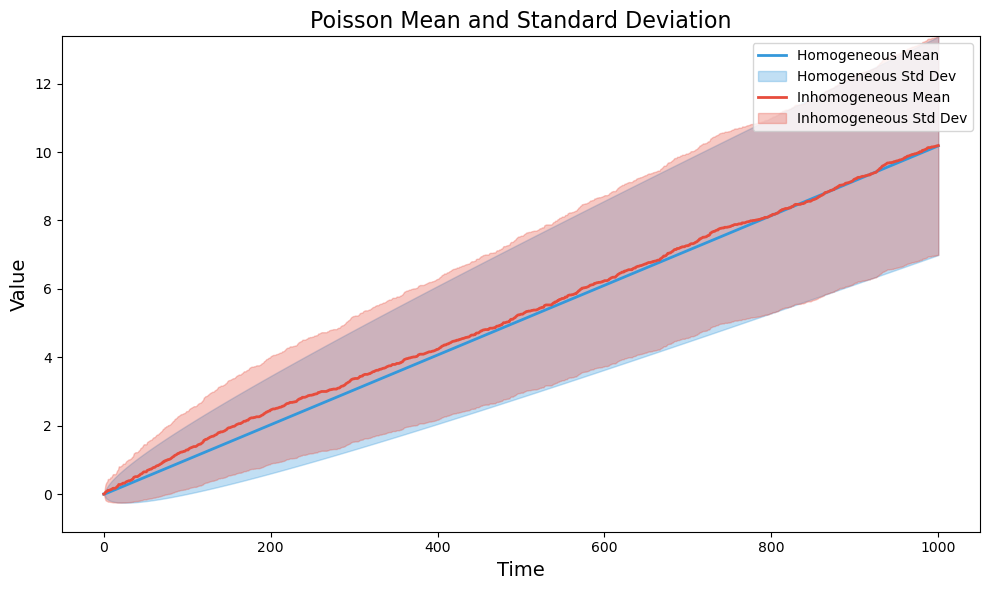

In [42]:
plot_stats(theoretical_means, empirical_mean, theoretical_std_dev, empirical_std_dev, title = 'Poisson Mean and Standard Deviation')

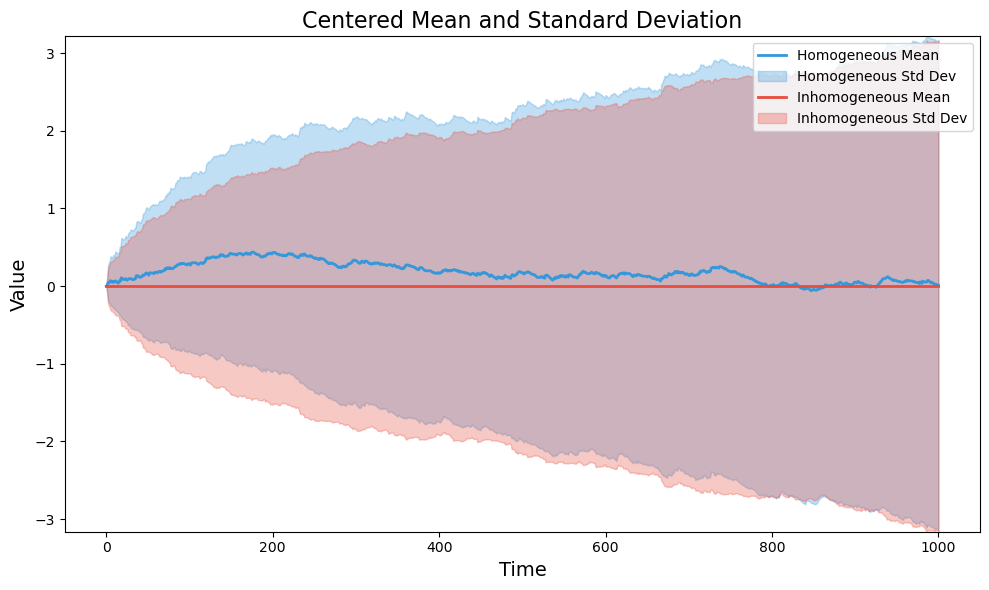

In [43]:
plot_stats(centers_mean, centers_mean_emp, centers_std_dev, centers_std_dev_emp, title = 'Centered Mean and Standard Deviation')

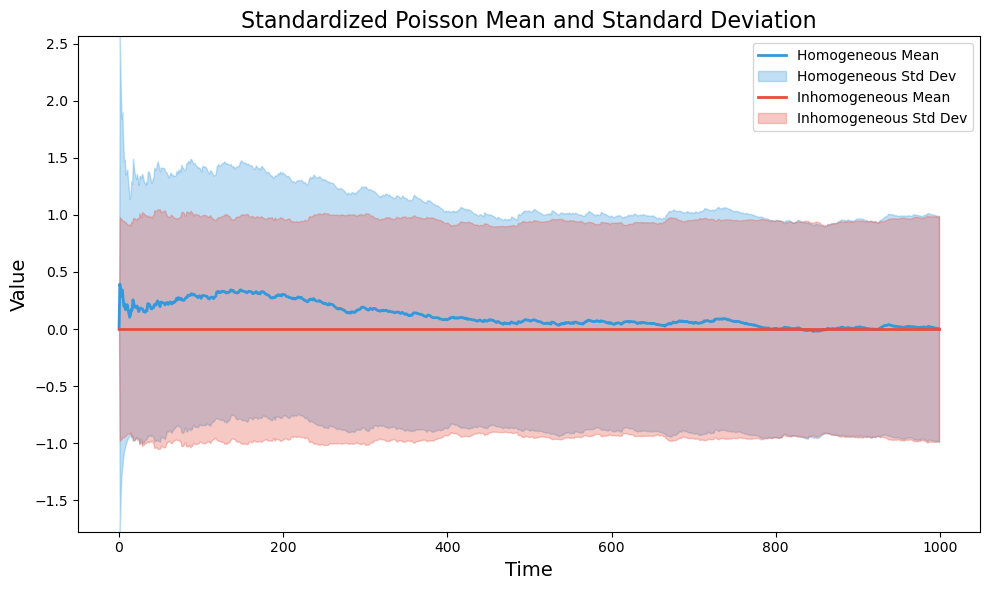

In [44]:
plot_stats(standardized_mean, standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Standardized Poisson Mean and Standard Deviation')

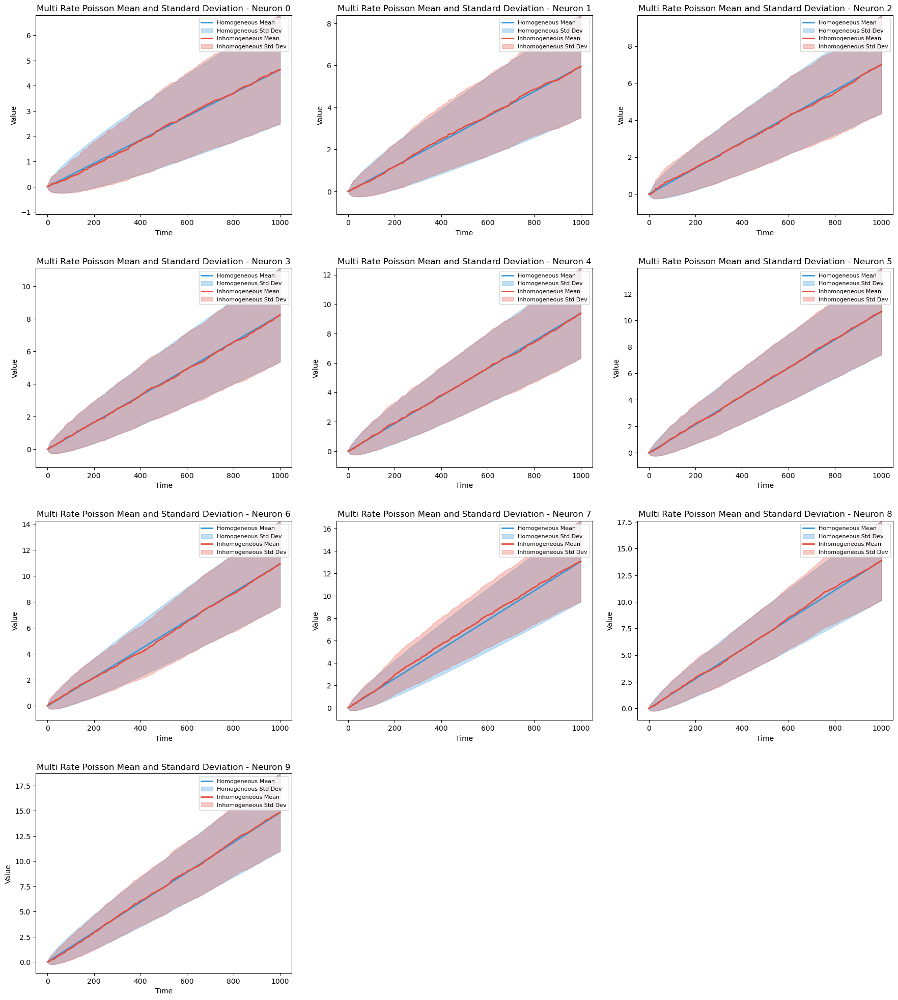

In [45]:
plot_multiple_stats(multi_rate_theoretical_means, multi_rate_empirical_mean, multi_rate_theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')

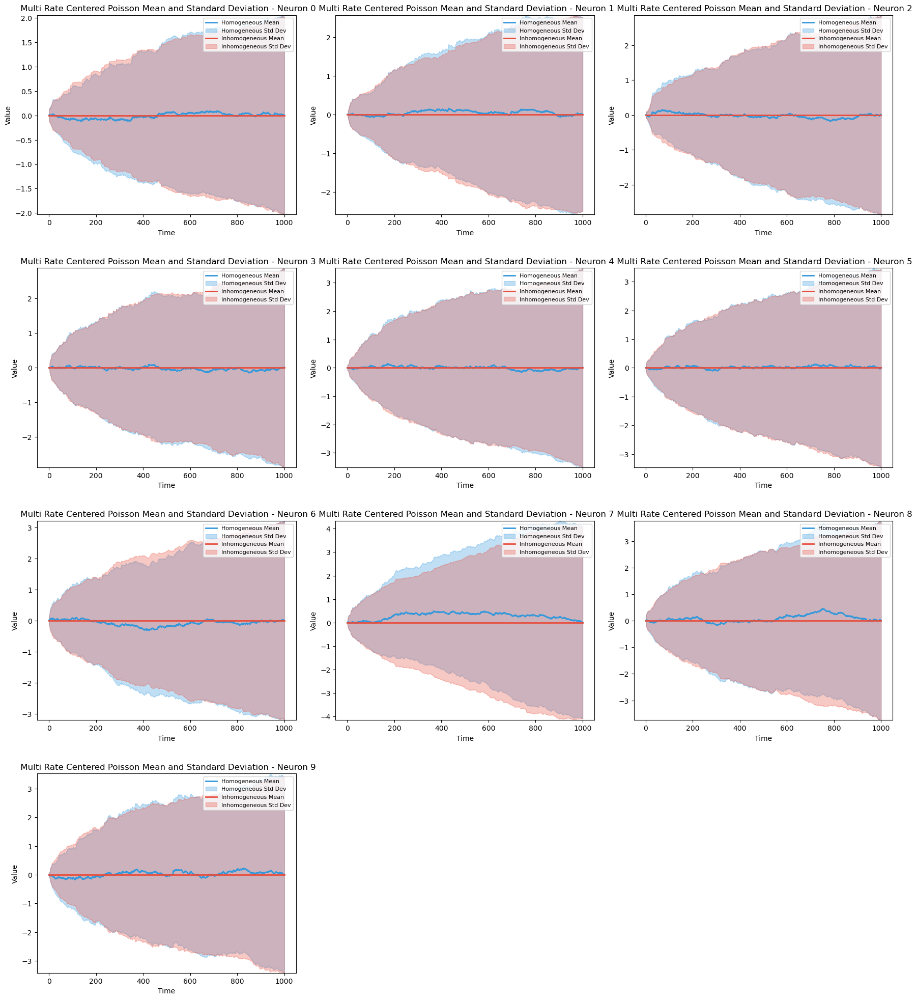

In [46]:
plot_multiple_stats(multi_rate_centers_mean, multi_rate_centers_mean_emp, multi_rate_centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation')

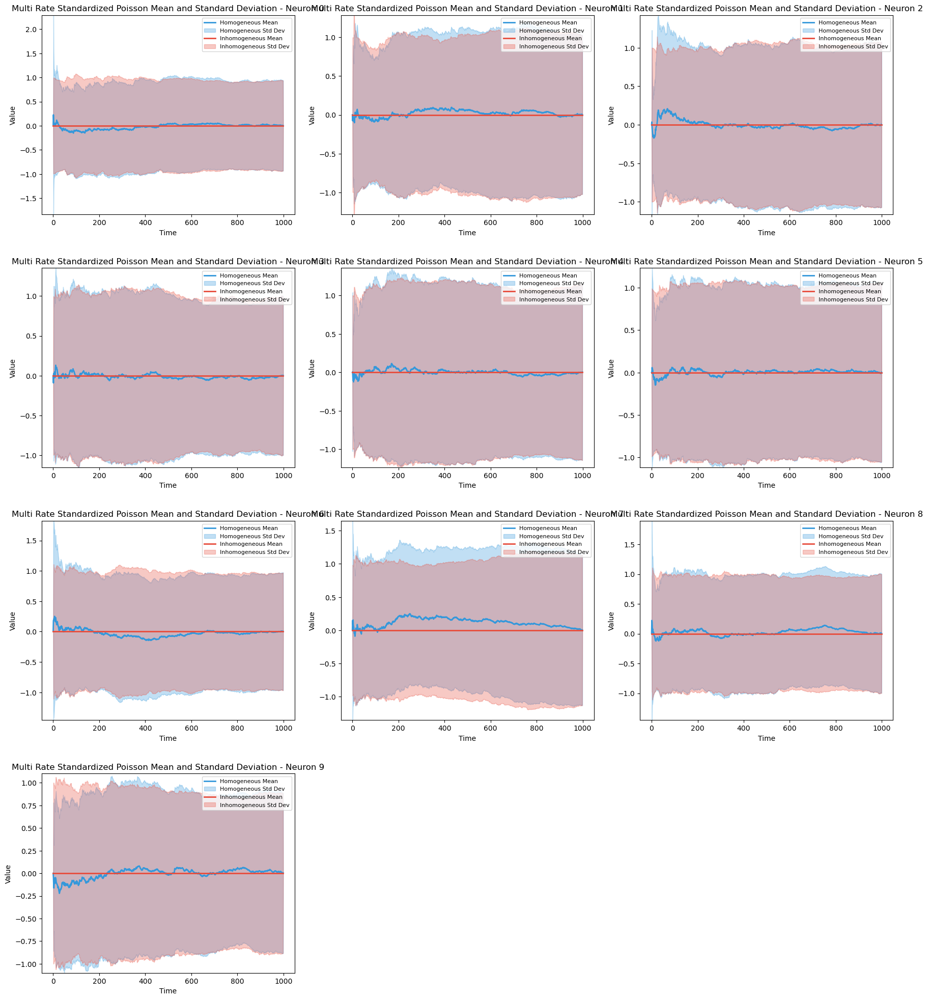

In [47]:
plot_multiple_stats(multi_rate_standardized_mean, multi_rate_standardized_mean_emp, multi_rate_standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')

Trajectory Experiments

In [49]:
total_log_likelihood, log_likelihood_per_sample = log_likelihood(empirical_mean, theoretical_means)
print(total_log_likelihood)
print(log_likelihood_per_sample)
# normalize data first (so we don't have any negative values, then we can do log likelihood)

#The neural spike patterns that are observed are unlikely to have come from the model...I got around -1600 log likelihood...

-16169.947049081493
[-1668.11823424 -1637.60590281 -1603.73272032 -1605.20282084
 -1613.8263093  -1611.9641179  -1622.51669231 -1596.51528188
 -1616.44363626 -1594.02133322]


In [50]:
mean_check = check_mean_with_se(stands, expected_mean=0, confidence=0.95)
#print(mean_check)

mean_check_emp = check_mean_with_se(stands_emp, expected_mean=0, confidence=0.95)
#print(mean_check_emp)

In [51]:
multi_rate_mean_check = check_mean_with_se(multi_rate_stands, expected_mean=0, confidence=0.95)
#print(multi_rate_mean_check)

multi_rate_mean_check_emp = check_mean_with_se(multi_rate_stands_emp, expected_mean=0, confidence=0.95)
#print(multi_rate_mean_check_emp)

In [52]:
serialized_count = serialize_counts(stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
t_stat, p_val_mean = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat)
#print(p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_emp = serialize_counts(stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
t_stat_emp, p_val_mean_emp = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [53]:
multi_rate_serialized_count = serialize_counts(multi_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
multi_rate_t_stat, multi_rate_p_val_mean = stats.ttest_1samp(multi_rate_serialized_count, np.mean(multi_rate_serialized_count))
#print(multi_rate_t_stat)
#print(multi_rate_p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


multi_rate_serialized_count_emp = serialize_counts(multi_rate_stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
multi_rate_t_stat_emp, multi_rate_p_val_mean_emp = stats.ttest_1samp(multi_rate_serialized_count_emp, np.mean(multi_rate_serialized_count_emp))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [54]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
reshaped_stands = np.transpose(stands, (1, 0, 2)).reshape(stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
reshaped_stands_emp = np.transpose(stands_emp, (1, 0, 2)).reshape(stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [55]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
multi_rate_reshaped_stands = np.transpose(multi_rate_stands, (1, 0, 2)).reshape(multi_rate_stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
multi_rate_reshaped_stands_emp = np.transpose(multi_rate_stands_emp, (1, 0, 2)).reshape(multi_rate_stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [56]:
#print(transpose_stands.shape)
#print(transpose_stands[:,:,0])

In [57]:
#print(transpose_stands[:,:,0:3])

In [58]:
#print(reshaped_stands.shape)
#print(reshaped_stands[:,0])

In [59]:
#print(reshaped_stands[:,:5])

In [60]:
#### TESTING #####

In [61]:
test_stand = standardize_per_neuron(count, exclude=global_exclude)


=== Post-standardization checks (excluded t < 1 ) ===
Max |mean|: 1.303e-16 (should be close to 0)
Max |std - 1|: 2.220e-16 (should be close to 0)


In [62]:
#print(test_stand.shape)

In [63]:
cov_matrix = cov_standardized_data(reshaped_stands)
#print(cov_matrix.shape)
#print(cov_matrix)

In [64]:
multi_rate_cov_matrix = cov_standardized_data(multi_rate_reshaped_stands)
#print(multi_rate_cov_matrix.shape)
#print(multi_rate_cov_matrix)

In [65]:
cov_matrix_emp = cov_standardized_data(reshaped_stands_emp)
#print(cov_matrix_emp.shape)
#print(cov_matrix_emp)

In [66]:
multi_rate_cov_matrix_emp = cov_standardized_data(multi_rate_reshaped_stands_emp)
#print(cov_matrix_emp.shape)
#print(cov_matrix_emp)

array([[ 1.03122798e+00,  7.21831841e-02, -4.46379791e-02,
         5.95939649e-03, -1.25042227e-03, -8.39486401e-02,
        -1.49153979e-02, -8.99057458e-02, -4.25990026e-02,
         6.40278835e-02],
       [ 7.21831841e-02,  8.90797848e-01, -6.30363186e-02,
        -2.26763192e-02,  9.00900731e-02,  5.93397374e-02,
        -3.19818067e-02,  7.40476680e-02,  1.28656548e-01,
         3.67911791e-03],
       [-4.46379791e-02, -6.30363186e-02,  1.15333032e+00,
         4.92807432e-02, -1.33087684e-01,  9.62742337e-02,
        -9.27183152e-02, -1.09723332e-02, -7.10048719e-02,
        -1.91895348e-01],
       [ 5.95939649e-03, -2.26763192e-02,  4.92807432e-02,
         1.12942427e+00,  4.90541633e-03,  7.82822706e-02,
        -7.07622186e-02, -3.58793735e-02, -3.90067368e-02,
         1.35377929e-01],
       [-1.25042227e-03,  9.00900731e-02, -1.33087684e-01,
         4.90541633e-03,  9.35317305e-01, -2.05916400e-02,
         4.45666164e-02, -4.70376695e-02,  3.02512881e-02,
         2.

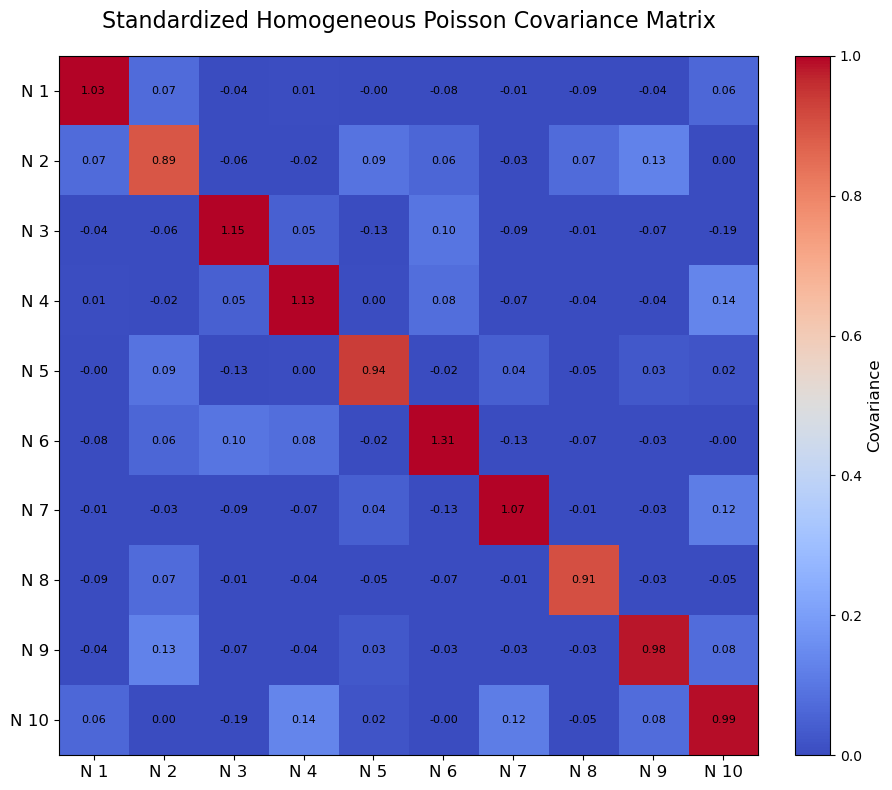

In [67]:
plot_covariance_matrix(cov_matrix, normalize=False, title='Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 9.12450907e-01,  5.88240425e-02, -4.71818548e-02,
         3.91274389e-04, -1.90137228e-03, -8.20965738e-02,
        -1.67272252e-02, -8.85076473e-02, -4.31766529e-02,
         5.95308592e-02],
       [ 5.88240425e-02,  8.33700109e-01, -6.54703962e-02,
        -2.44204762e-02,  9.07987807e-02,  5.66408171e-02,
        -3.22202663e-02,  7.02306995e-02,  1.22900376e-01,
         4.96116679e-03],
       [-4.71818548e-02, -6.54703962e-02,  1.10957225e+00,
         4.67788228e-02, -1.30413871e-01,  9.36736250e-02,
        -9.19900709e-02, -1.08465984e-02, -7.18334755e-02,
        -1.88286837e-01],
       [ 3.91274389e-04, -2.44204762e-02,  4.67788228e-02,
         1.10571657e+00,  5.60971359e-03,  7.62253377e-02,
        -7.04989682e-02, -3.59081902e-02, -3.88804784e-02,
         1.35043239e-01],
       [-1.90137228e-03,  9.07987807e-02, -1.30413871e-01,
         5.60971359e-03,  9.43959933e-01, -1.99576601e-02,
         4.49319226e-02, -4.76113261e-02,  2.97664222e-02,
         2.

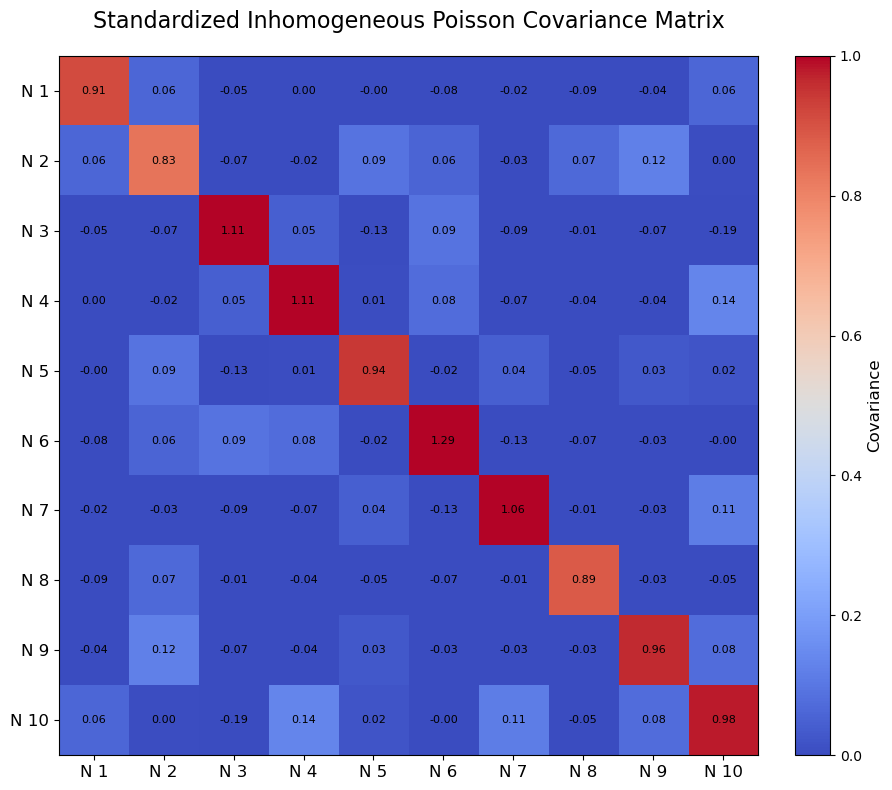

In [68]:
plot_covariance_matrix(cov_matrix_emp, normalize=False, title='Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 8.96330081e-01,  4.81295966e-02,  7.21857160e-02,
        -6.08626515e-03, -1.73129908e-02, -1.05610914e-02,
        -3.25279970e-02,  5.76441319e-02, -6.62926505e-02,
         4.64466223e-02],
       [ 4.81295966e-02,  1.06149389e+00,  3.02509135e-02,
        -3.82231673e-02,  7.59880873e-02,  1.08392216e-02,
         3.65134489e-02, -1.67487879e-02, -5.88284973e-02,
         1.01314375e-01],
       [ 7.21857160e-02,  3.02509135e-02,  1.07842182e+00,
         9.12829053e-04,  1.39773977e-01,  7.50978467e-02,
        -4.80280050e-02,  2.65684452e-02, -1.49522651e-01,
        -2.48963072e-02],
       [-6.08626515e-03, -3.82231673e-02,  9.12829053e-04,
         1.03027379e+00,  6.23049666e-02,  1.27650062e-01,
        -6.04690685e-02,  1.07119977e-02,  6.76801876e-02,
         1.20003192e-02],
       [-1.73129908e-02,  7.59880873e-02,  1.39773977e-01,
         6.23049666e-02,  1.26868311e+00, -5.24978370e-02,
        -1.32147118e-01,  2.58793658e-01,  1.50010851e-01,
        -5.

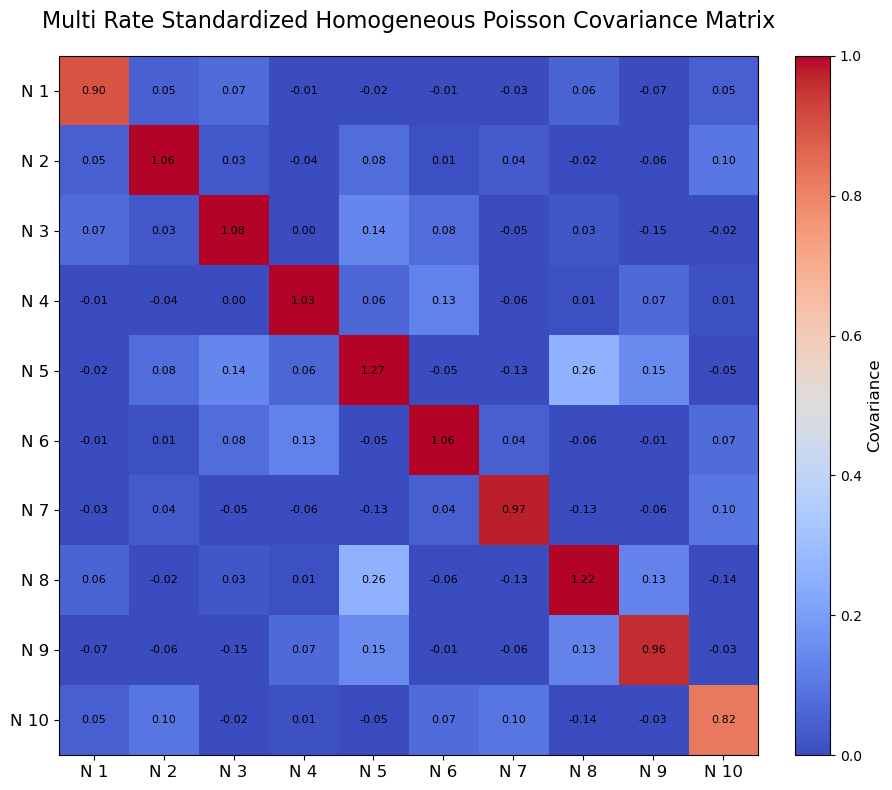

In [69]:
plot_covariance_matrix(multi_rate_cov_matrix, normalize=False, title='Multi Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 9.15583062e-01,  4.93105426e-02,  7.48109841e-02,
        -5.51965856e-03, -1.87262910e-02, -1.04624408e-02,
        -3.45413697e-02,  5.93824764e-02, -6.89591364e-02,
         4.70460920e-02],
       [ 4.93105426e-02,  1.05385495e+00,  3.14786081e-02,
        -3.74082513e-02,  7.54464220e-02,  1.04017644e-02,
         3.89687363e-02, -1.86477263e-02, -5.84746373e-02,
         1.00936588e-01],
       [ 7.48109841e-02,  3.14786081e-02,  1.06824708e+00,
        -9.79622201e-04,  1.38287353e-01,  7.51094537e-02,
        -4.73788562e-02,  2.87762285e-02, -1.48574096e-01,
        -2.29744518e-02],
       [-5.51965856e-03, -3.74082513e-02, -9.79622201e-04,
         1.03059429e+00,  6.15907569e-02,  1.27980620e-01,
        -6.18535239e-02,  1.15952722e-02,  6.76445215e-02,
         1.20437812e-02],
       [-1.87262910e-02,  7.54464220e-02,  1.38287353e-01,
         6.15907569e-02,  1.26830215e+00, -5.28962121e-02,
        -1.32284774e-01,  2.52518953e-01,  1.50203344e-01,
        -5.

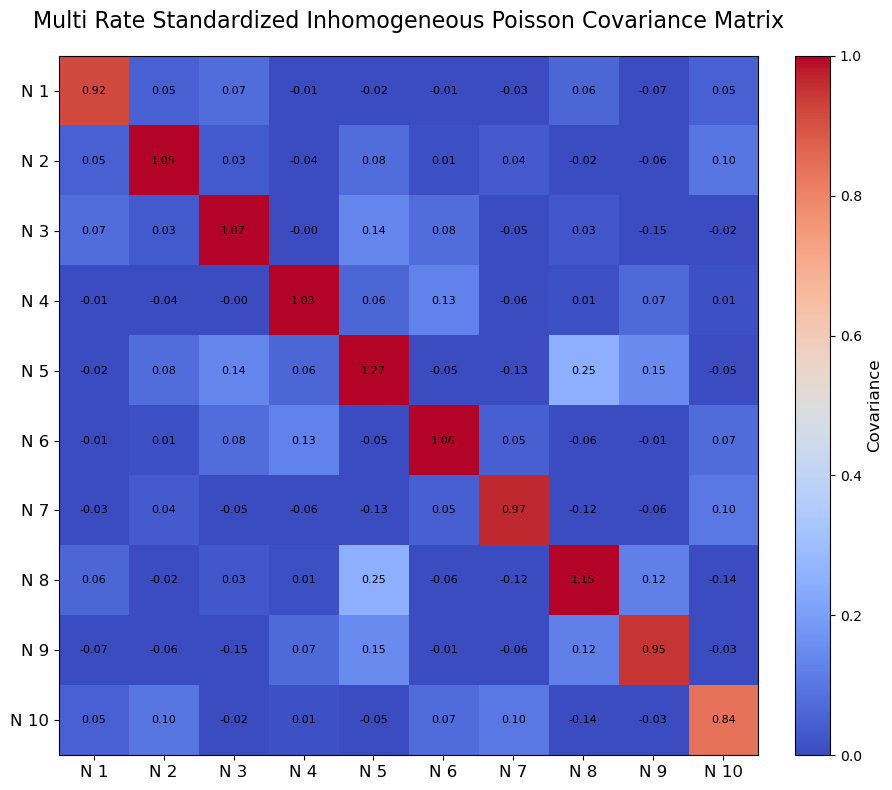

In [70]:
plot_covariance_matrix(multi_rate_cov_matrix_emp, normalize=False, title='Multi Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

In [71]:
#### TESTING END #####

In [72]:
#hotelling_result = hotelling_t2_test(reshaped_stands, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result)
#hotelling_result_emp = hotelling_t2_test(reshaped_stands_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_emp)

In [73]:
#good_result = stats.goodness_of_fit(stats.norm, serialized_count, statistic='ad', n_mc_samples=9999, rng=None)
# Anderson-Darling test (good for normality)
# Number of Monte Carlo samples
# Random number generator (None for fresh results)

#print(f"Statistic: {good_result.statistic}")
#print(f"P-value: {good_result.pvalue}")
#print(f"Location (mean): {good_result.fit_result.params.loc}")
#print(f"Scale (std dev): {good_result.fit_result.params.scale}")

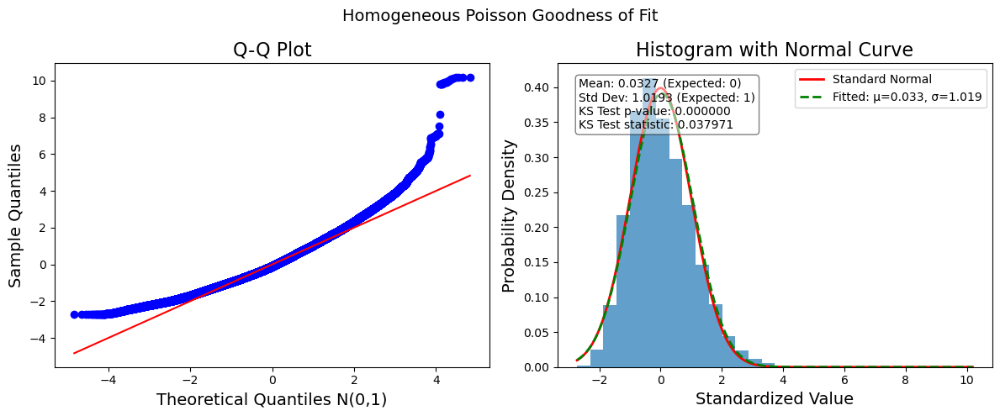

In [74]:
goodness, fig = analyze_poisson_goodness_of_fit(serialized_count, plot_title="Homogeneous Poisson Goodness of Fit", sample_limit=5000)

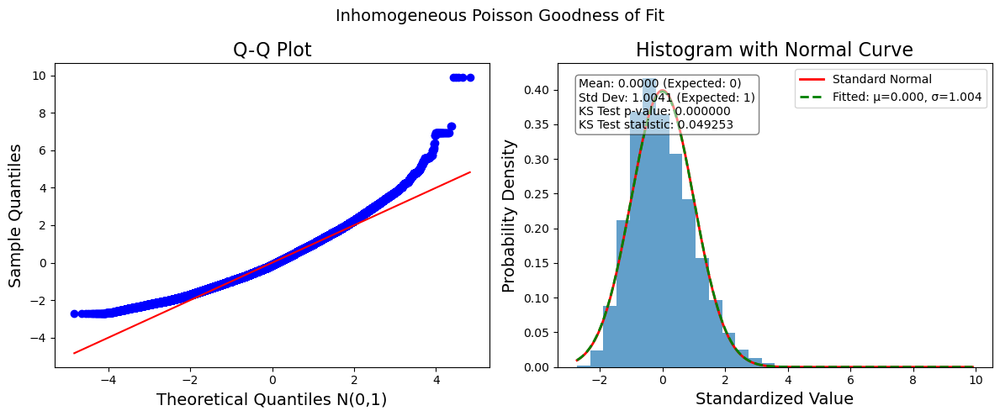

In [75]:
goodness_emp, fig_emp = analyze_poisson_goodness_of_fit(serialized_count_emp, plot_title="Inhomogeneous Poisson Goodness of Fit", sample_limit=5000)

In [76]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)
#rv = multivariate_normal(mean = [0,0], cov = cov_matrix, allow_singular = False)
#rv_emp = multivariate_normal(mean = [0,0], cov = cov_matrix_emp, allow_singular=False)
#print(rv)
#print(rv_emp)

# this is creating its own model, from this we can test if the data has goodness of fit

In [77]:
#cov_matrix, diagonal_ones = covariance_diagonal(reshaped_stands, tol=1e-8)
#print(cov_matrix)
#print(diagonal_ones)
#cov_matrix_emp, diagonal_ones_emp = covariance_diagonal(reshaped_stands_emp, tol=1e-8)
#print(cov_matrix_emp)
#print(diagonal_ones_emp)

Theoretical and Empirical stats of excitatory counts.

In [79]:
# empirical_mean_ex = empirical_means(count_ex)
empirical_mean_ex = count_ex.mean(axis=0)
#print(empirical_mean_ex)
#print(empirical_mean_ex.shape)
count_rate_ex = empirical_mean_ex[:, -1]

# empirical_std_dev_ex = std_dev_empirical_mean(empirical_mean_ex, num_samples, count_ex)
#empirical_std_dev_ex = count_ex.std(axis=0, ddof=1)
empirical_std_dev_ex = np.sqrt(empirical_mean_ex)
#print(empirical_std_dev_ex)
#print(empirical_std_dev_ex.shape)

empirical_lower_bound_ex, empirical_upper_bound_ex = confidence_intervals(empirical_mean_ex, empirical_std_dev_ex, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_ex)
# print(empirical_upper_bound_sim_ex)

In [80]:
exclude_times_ex, global_exclude_ex = last_zero_std_time(empirical_std_dev_ex, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=0, recommended exclude=1
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=0, recommended exclude=1
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [81]:
theoretical_means_sim_ex = calculate_theoretical_mean(count_rate_ex, time)
#print(theoretical_means_sim_ex)
#print(theoretical_means_sim_ex.shape)

theoretical_std_dev_sim_ex = calculate_theoretical_std_dev(theoretical_means_sim_ex)
#print(theoretical_std_dev_sim_ex)
#print(theoretical_std_dev_sim_ex.shape)

theoretical_lower_bound_sim_ex, theoretical_upper_bound_sim_ex = confidence_intervals(theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_ex)
# print(theoretical_upper_bound_sim_ex)

In [82]:
res_var_ex = variance_of_residuals(empirical_mean_ex, theoretical_means_sim_ex)
#print(res_var_ex)

In [83]:
stands_ex = standardize_counts_loop(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, num_neurons, exclude = 1)
#print(stands_ex)
#print(stands_ex.shape)

stands_ex_emp = standardize_counts_loop(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, num_neurons, global_exclude_ex)
#print(stands_ex_emp)
#print(stands_ex_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_ex = np.mean(stands_ex)
standardized_std_global_ex = np.std(stands_ex)

standardized_mean_emp_global_ex = np.mean(stands_ex_emp)
standardized_std_emp_global_ex = np.std(stands_ex_emp)

standardized_mean_ex = np.mean(stands_ex, axis=0)
standardized_std_ex = np.std(stands_ex, axis=0, ddof = 1)

standardized_mean_ex_emp = np.mean(stands_ex_emp, axis = 0)
standardized_std_ex_emp = np.std(stands_ex_emp, axis = 0, ddof = 1)

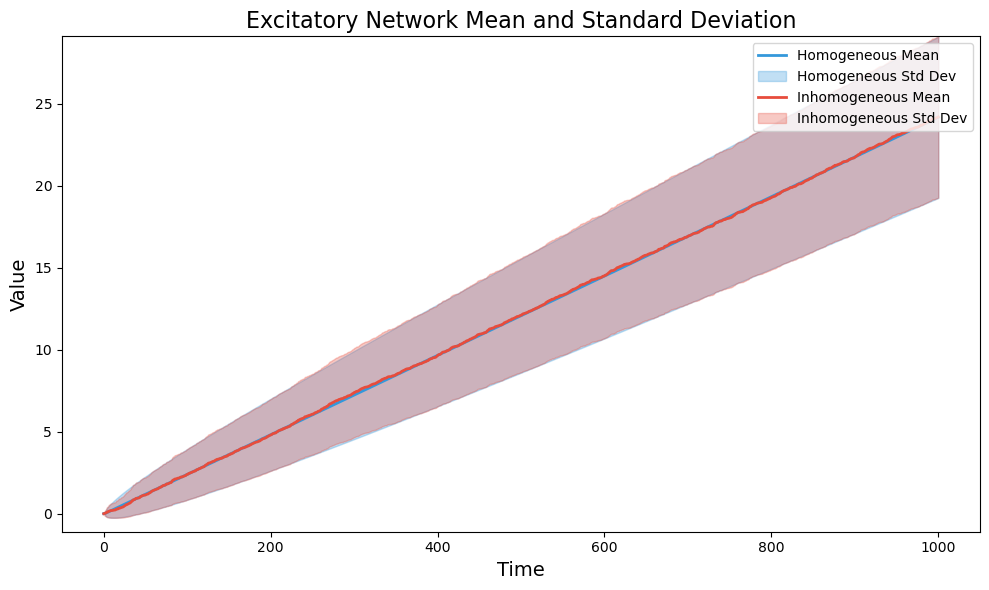

In [84]:
plot_stats(theoretical_means_sim_ex, empirical_mean_ex, theoretical_std_dev_sim_ex, empirical_std_dev_ex, title = 'Excitatory Network Mean and Standard Deviation')

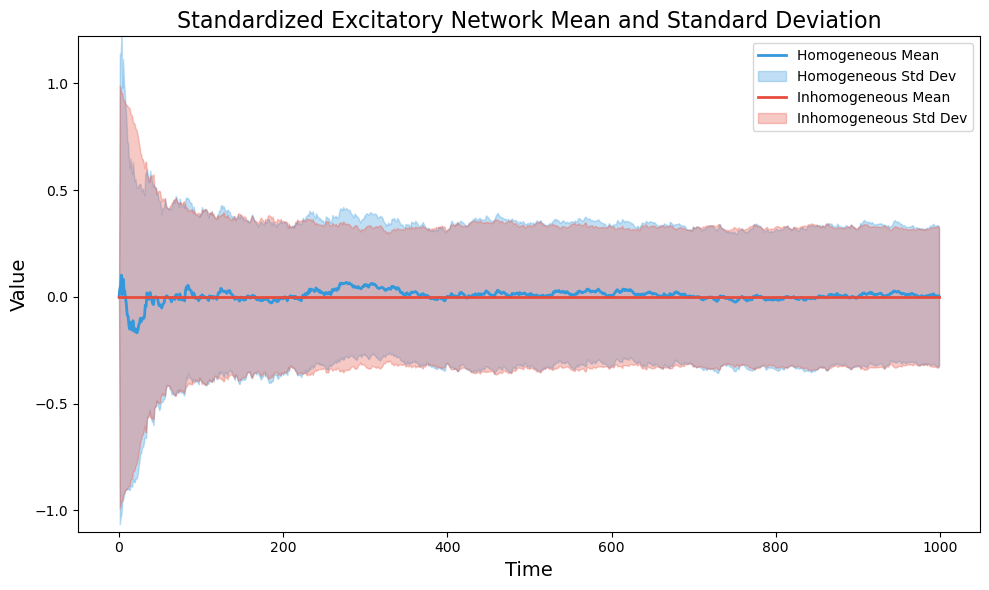

In [85]:
plot_stats(standardized_mean_ex, standardized_mean_ex_emp, standardized_std_ex, standardized_std_ex_emp, title = 'Standardized Excitatory Network Mean and Standard Deviation')

In [86]:
mean_check_ex = check_mean_with_se(stands_ex, expected_mean=0, confidence=0.95)
#print(mean_check_ex)

mean_check_ex_emp = check_mean_with_se(stands_ex_emp, expected_mean=0, confidence=0.95)
#print(mean_check_ex_emp)

In [87]:
serialized_count_ex = serialize_counts(stands_ex) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex.shape)
#print(np.mean(serialized_count_ex))
t_stat_ex, p_val_mean_ex = stats.ttest_1samp(serialized_count_ex, np.mean(serialized_count_ex))
#print(t_stat_ex)
#print(p_val_mean_ex)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables

serialized_count_ex_emp = serialize_counts(stands_ex_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex_emp.shape)
#print(np.mean(serialized_count_ex_emp))
t_stat_ex_emp, p_val_mean_ex_emp = stats.ttest_1samp(serialized_count_ex_emp, np.mean(serialized_count_ex_emp))
#print(t_stat_ex_emp)
#print(p_val_mean_ex_emp)

In [88]:
#reshaped_stands_ex = np.reshape(stands_ex, (-1, stands_ex.shape[1]), order='F')
reshaped_stands_ex = np.transpose(stands_ex, (1, 0, 2)).reshape(stands_ex.shape[1], -1)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)

#could change the values from num_samples, num_neurons, time to 10 by large number, could transpose it
# make sure coviariance matrix is using row data, don't use np.cov because it throws away the mean
# covariance is the data and the transpose of the data divided sqrt(n-1), lookup how covariance is calculated and make it by hand.
# try to iterate over samples, as in each time point, 

# reshaped_stands_ex_emp = np.reshape(stands_ex_emp, (-1, stands_ex_emp.shape[1]), order='F')
reshaped_stands_ex_emp = np.transpose(stands_ex_emp, (1, 0, 2)).reshape(stands_ex_emp.shape[1], -1)
#print(stands_ex_emp.shape)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)
#print(stands_ex[:,:,0])
#print(reshaped_stands[:,0])
#print(stands_ex_emp[:,:,0].shape)
#print(stands_ex_emp[:10,:,0])
#print(reshaped_stands_ex_emp.shape)
#print(reshaped_stands_ex_emp[:10,:])

In [89]:
transpose_stands_ex = np.transpose(stands_ex, (1, 0, 2))
#print(transpose_stands_ex[:,:,0:3])

In [90]:
#print(reshaped_stands_ex[:,:5])

In [91]:
#print("Time point 0:", stands_ex[:,:,0])
#print("Time point 1:", stands_ex[:,:,1])
#print("Time point 100:", stands_ex[:,:,100])

In [92]:
cov_matrix_ex = cov_standardized_data(reshaped_stands_ex)
cov_matrix_ex_emp = cov_standardized_data(reshaped_stands_ex_emp)

array([[ 0.13579265,  0.02919823,  0.02392333,  0.03329657,  0.02123889,
         0.03458237,  0.03512073,  0.03437551,  0.02542671,  0.02542838],
       [ 0.02919823,  0.13017861,  0.01166636,  0.01771951,  0.0148542 ,
         0.03188008,  0.03142193,  0.00885226,  0.00362475,  0.00457593],
       [ 0.02392333,  0.01166636,  0.27642638,  0.0290206 ,  0.03039313,
         0.02954128,  0.05235012,  0.04382779,  0.06550157,  0.00784   ],
       [ 0.03329657,  0.01771951,  0.0290206 ,  0.14327766,  0.02449552,
         0.02996676,  0.01035598,  0.03502407,  0.03361129, -0.01247106],
       [ 0.02123889,  0.0148542 ,  0.03039313,  0.02449552,  0.14356428,
         0.01624883,  0.02345347,  0.03192658,  0.02672679,  0.04845074],
       [ 0.03458237,  0.03188008,  0.02954128,  0.02996676,  0.01624883,
         0.20779159,  0.03550445,  0.02661045,  0.03788296,  0.02410622],
       [ 0.03512073,  0.03142193,  0.05235012,  0.01035598,  0.02345347,
         0.03550445,  0.23219178,  0.01903213

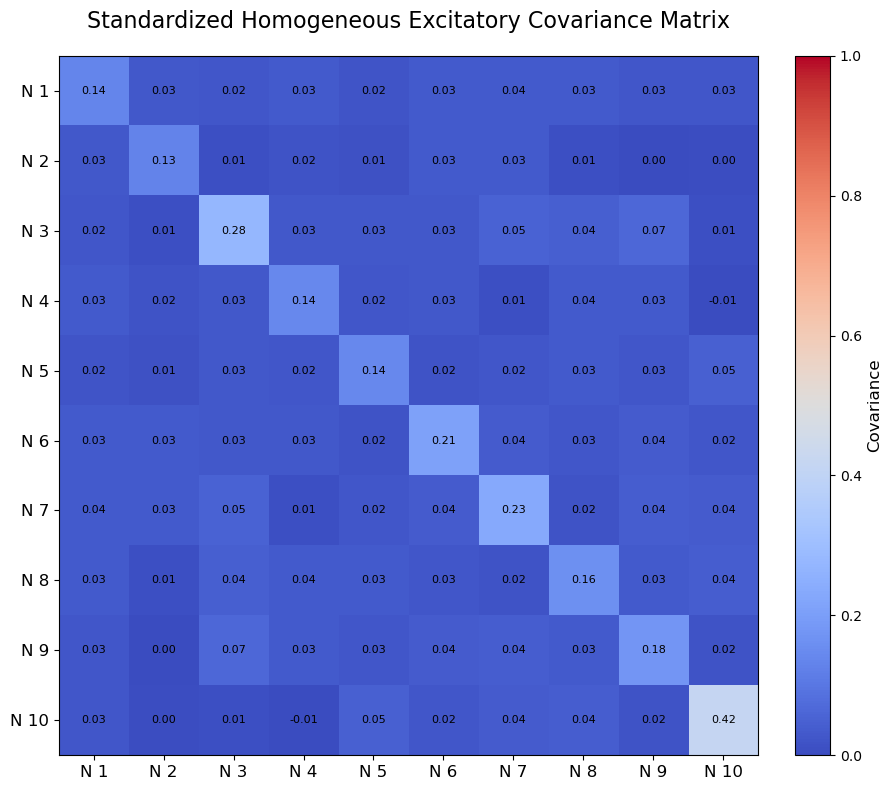

In [93]:
plot_covariance_matrix(cov_matrix_ex, normalize=False, title="Standardized Homogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.13624399,  0.02874365,  0.02390379,  0.03390747,  0.02107653,
         0.03468432,  0.03563357,  0.03464918,  0.02566499,  0.02575321],
       [ 0.02874365,  0.1241406 ,  0.01069898,  0.0184248 ,  0.01455462,
         0.03190933,  0.03274704,  0.00954136,  0.00368307,  0.00448727],
       [ 0.02390379,  0.01069898,  0.26732008,  0.0293157 ,  0.03003708,
         0.02927694,  0.0529789 ,  0.04428924,  0.06508018,  0.00766682],
       [ 0.03390747,  0.0184248 ,  0.0293157 ,  0.14640826,  0.02417777,
         0.03027664,  0.00903433,  0.03489449,  0.03350678, -0.01206764],
       [ 0.02107653,  0.01455462,  0.03003708,  0.02417777,  0.14182297,
         0.01617382,  0.0234178 ,  0.03190504,  0.02623937,  0.04886015],
       [ 0.03468432,  0.03190933,  0.02927694,  0.03027664,  0.01617382,
         0.2098583 ,  0.03466936,  0.02657938,  0.03769489,  0.02381076],
       [ 0.03563357,  0.03274704,  0.0529789 ,  0.00903433,  0.0234178 ,
         0.03466936,  0.23685848,  0.01789222

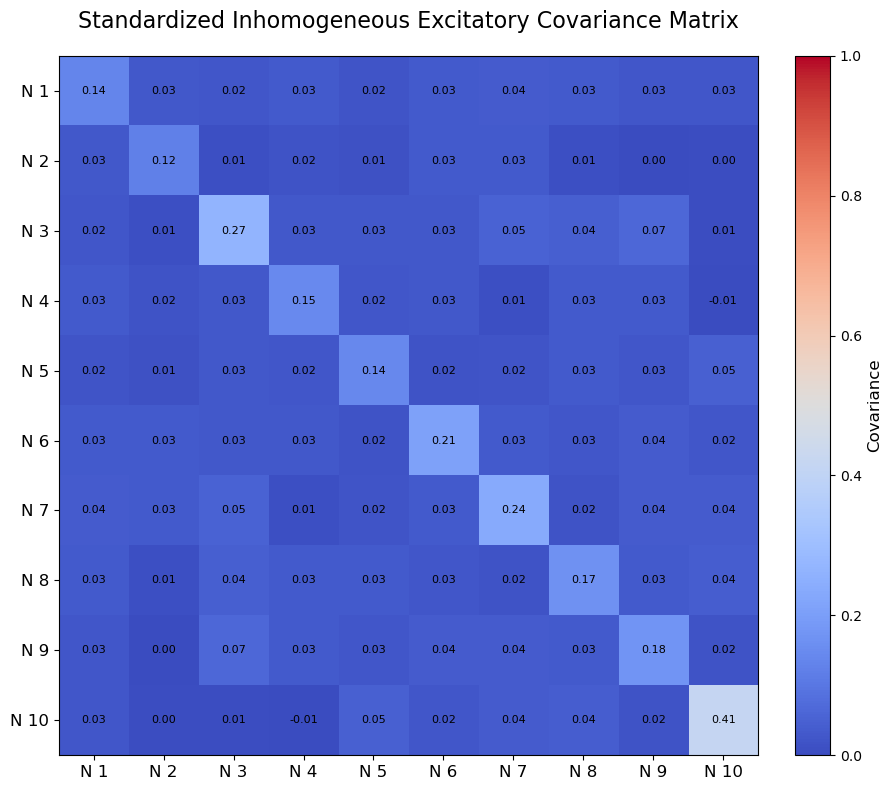

In [94]:
plot_covariance_matrix(cov_matrix_ex_emp, normalize=False, title="Standardized Inhomogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [95]:
#hotelling_result_ex = hotelling_t2_test(reshaped_stands_ex, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex)
#hotelling_result_ex_emp = hotelling_t2_test(reshaped_stands_ex_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex_emp)

In [96]:
#cov_matrix_ex, diagonal_ones_ex = covariance_diagonal(reshaped_stands_ex, tol=1e-8)
#print(cov_matrix_ex)
#print(diagonal_ones_ex)
#cov_matrix_ex_emp, diagonal_ones_ex_emp = covariance_diagonal(reshaped_stands_ex_emp, tol=1e-8)
#print(cov_matrix_ex_emp)
#print(diagonal_ones_ex_emp)

In [97]:
#### TESTING #####
#plot_covariance_matrix(reshaped_data, normalize=False, title="Excitatory Theoretical Covariance Matrix", cmap='coolwarm', annot=True)

In [98]:
#### TESTING ####
#plot_covariance_matrix(reshaped_data_emp, normalize=False, title="Excitatory Empirical Covariance Matrix", cmap='coolwarm', annot=True)

In [99]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_ex = multivariate_normal(mean = theoretical_means_sim_ex, cov = cov_matrix_ex, allow_singular=allow_singular)
# rv_ex_emp = multivariate_normal(mean = empirical_mean_ex, cov = cov_matrix_ex_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

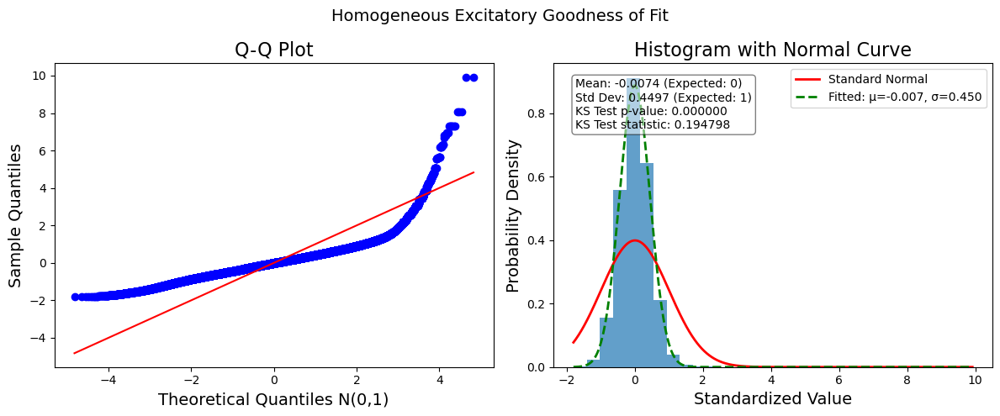

In [100]:
goodness_ex, fig_ex = analyze_poisson_goodness_of_fit(serialized_count_ex, plot_title="Homogeneous Excitatory Goodness of Fit", sample_limit=5000)

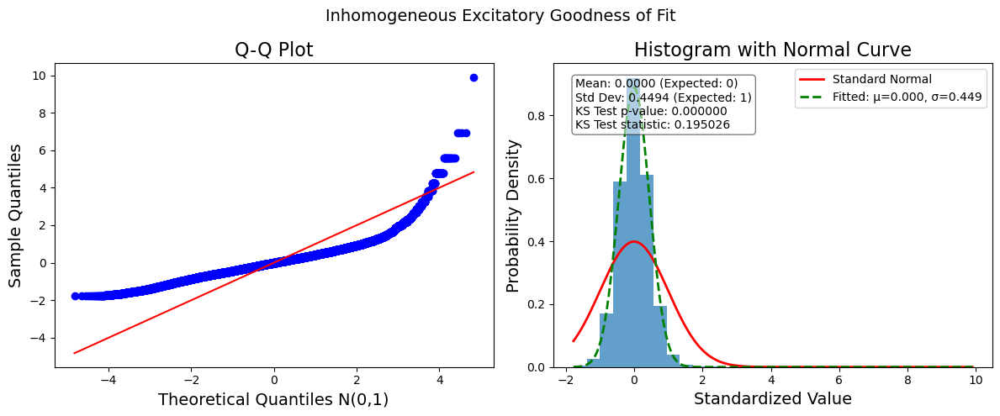

In [101]:
goodness_ex_emp, fig_ex_emp = analyze_poisson_goodness_of_fit(serialized_count_ex_emp, plot_title="Inhomogeneous Excitatory Goodness of Fit", sample_limit=5000)

Theoretical and Empirical stats of inhibitory counts.

In [103]:
# empirical_mean_in = empirical_means(count_in)
empirical_mean_in = count_in.mean(axis=0)
#print(empirical_mean_in)
#print(empirical_mean_in.shape)
count_rate_in = empirical_mean_in[:, -1]

#empirical_std_dev_in = std_dev_empirical_mean(empirical_mean_in, num_samples, count_in)
#empirical_std_dev_in = count_in.std(axis=0, ddof=1)
empirical_std_dev_in = np.sqrt(empirical_mean_in)
#print(empirical_std_dev_in)
#print(empirical_std_dev_in.shape)

empirical_lower_bound_in, empirical_upper_bound_in = confidence_intervals(empirical_mean_in, empirical_std_dev_in, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_in)
# print(empirical_upper_bound_sim_in)

In [104]:
exclude_times_in, global_exclude_in = last_zero_std_time(empirical_std_dev_in, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=0, recommended exclude=1
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [105]:
theoretical_means_sim_in = calculate_theoretical_mean(count_rate_in, time)
#print(theoretical_means_sim_in)
#print(theoretical_means_sim_in.shape)

theoretical_std_dev_sim_in = calculate_theoretical_std_dev(theoretical_means_sim_in)
#print(theoretical_std_dev_sim_in)
#print(theoretical_std_dev_sim_in.shape)

theoretical_lower_bound_sim_in, theoretical_upper_bound_sim_in = confidence_intervals(theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_in)
# print(theoretical_upper_bound_sim_in)

In [106]:
res_var_in = variance_of_residuals(empirical_mean_in, theoretical_means_sim_in)
#print(res_var_in)

In [107]:
stands_in = standardize_counts_loop(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, num_neurons, exclude = 1)
#print(stands_in)
#print(stands_in.shape)

stands_in_emp = standardize_counts_loop(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, num_neurons, global_exclude_in)
#print(stands_in_emp)
#print(stands_in_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_in = np.mean(stands_in)
standardized_std_global_in = np.std(stands_in)

standardized_mean_emp_global_in = np.mean(stands_in_emp)
standardized_std_emp_global_in = np.std(stands_in_emp)

standardized_mean_in = np.mean(stands_in, axis=0)
standardized_std_in = np.std(stands_in, axis=0, ddof = 1)

standardized_mean_in_emp = np.mean(stands_in_emp, axis = 0)
standardized_std_in_emp = np.std(stands_in_emp, axis = 0, ddof = 1)

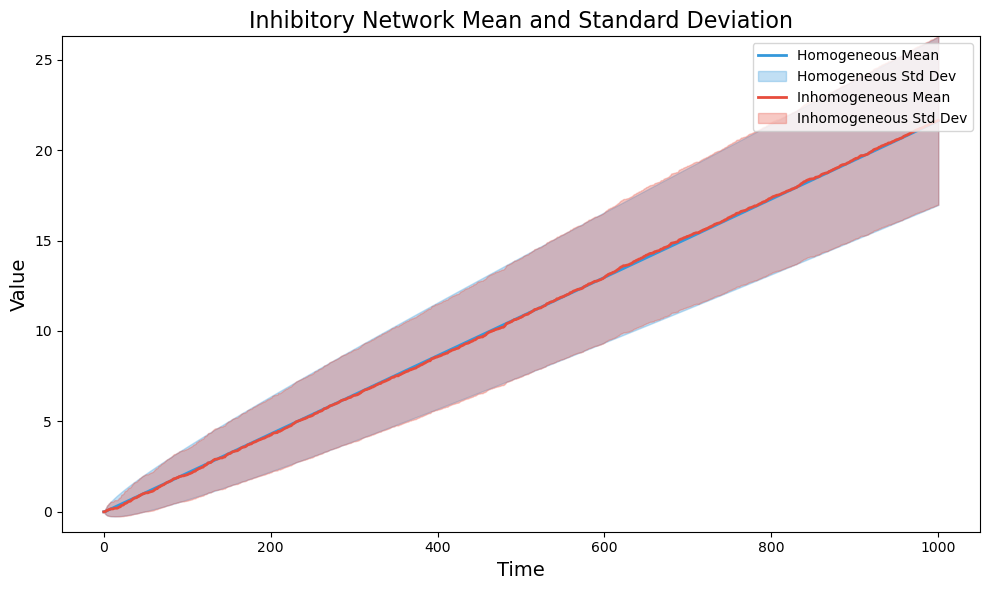

In [108]:
plot_stats(theoretical_means_sim_in , empirical_mean_in, theoretical_std_dev_sim_in, empirical_std_dev_in, title = 'Inhibitory Network Mean and Standard Deviation')

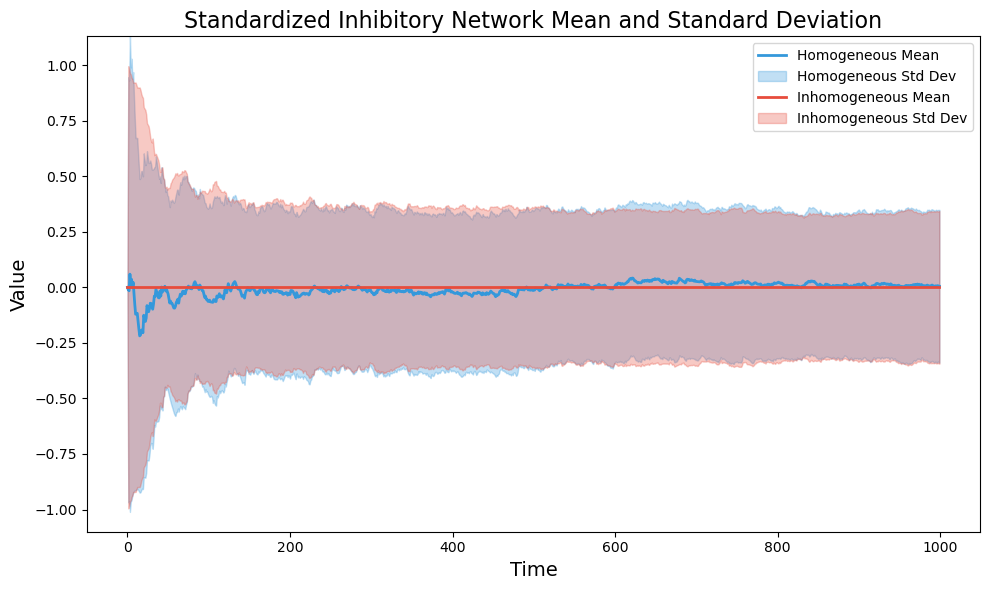

In [109]:
plot_stats(standardized_mean_in, standardized_mean_in_emp, standardized_std_in, standardized_std_in_emp, title = 'Standardized Inhibitory Network Mean and Standard Deviation')

In [110]:
mean_check_in = check_mean_with_se(stands_in, expected_mean=0, confidence=0.95)
#print(mean_check_in)

mean_check_in_emp = check_mean_with_se(stands_in_emp, expected_mean=0, confidence=0.95)
#print(mean_check_in_emp)

In [111]:
serialized_count_in = serialize_counts(stands_in) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in.shape)
#print(np.mean(serialized_count_in))
t_stat_in, p_val_mean_in = stats.ttest_1samp(serialized_count_in, np.mean(serialized_count_in))
#print(t_stat_in)
#print(p_val_mean_in)
    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_in_emp = serialize_counts(stands_in_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in_emp.shape)
#print(np.mean(serialized_count_in_emp))
t_stat_in_emp, p_val_mean_in_emp = stats.ttest_1samp(serialized_count_in_emp, np.mean(serialized_count_in_emp))
#print(t_stat_in_emp)
#print(p_val_mean_in_emp)

In [112]:
#reshaped_stands_in = np.reshape(stands_in, (-1, stands_in.shape[1]), order='F')
reshaped_stands_in = np.transpose(stands_in, (1, 0, 2)).reshape(stands_in.shape[1], -1)
#print(stands_in.shape)
#print(reshaped_stands_in.shape)

#reshaped_stands_in_emp = np.reshape(stands_in_emp, (-1, stands_in_emp.shape[1]), order='F')
reshaped_stands_in_emp = np.transpose(stands_in_emp, (1, 0, 2)).reshape(stands_in_emp.shape[1], -1)
#print(stands_in_emp.shape)
#print(reshaped_stands_in_emp.shape)

In [113]:
cov_matrix_in = cov_standardized_data(reshaped_stands_in)
cov_matrix_in_emp = cov_standardized_data(reshaped_stands_in_emp)

array([[ 1.47385330e-01,  1.02749204e-02,  4.42323128e-03,
        -4.86955715e-02,  1.74908138e-02, -6.14711626e-03,
         1.96274094e-02,  1.71673634e-02,  9.05045976e-03,
        -1.26013610e-03],
       [ 1.02749204e-02,  1.28077667e-01,  1.78625719e-02,
         4.03552288e-02,  1.85502519e-02,  2.46873407e-02,
         1.30134198e-02,  2.94814995e-02,  2.89526281e-02,
         1.70235746e-02],
       [ 4.42323128e-03,  1.78625719e-02,  1.90927816e-01,
        -1.07589056e-02,  2.17417642e-02,  2.37736793e-02,
         2.18921512e-02,  2.15007432e-02,  2.64253689e-02,
         3.07982222e-02],
       [-4.86955715e-02,  4.03552288e-02, -1.07589056e-02,
         7.85776297e-01, -6.56025915e-04, -1.78116587e-03,
        -3.29987774e-03,  1.45819513e-02,  2.05896894e-02,
         2.68253544e-03],
       [ 1.74908138e-02,  1.85502519e-02,  2.17417642e-02,
        -6.56025915e-04,  1.24623167e-01,  9.60113725e-03,
         1.85017417e-02,  5.36947897e-03,  2.55927992e-03,
         1.

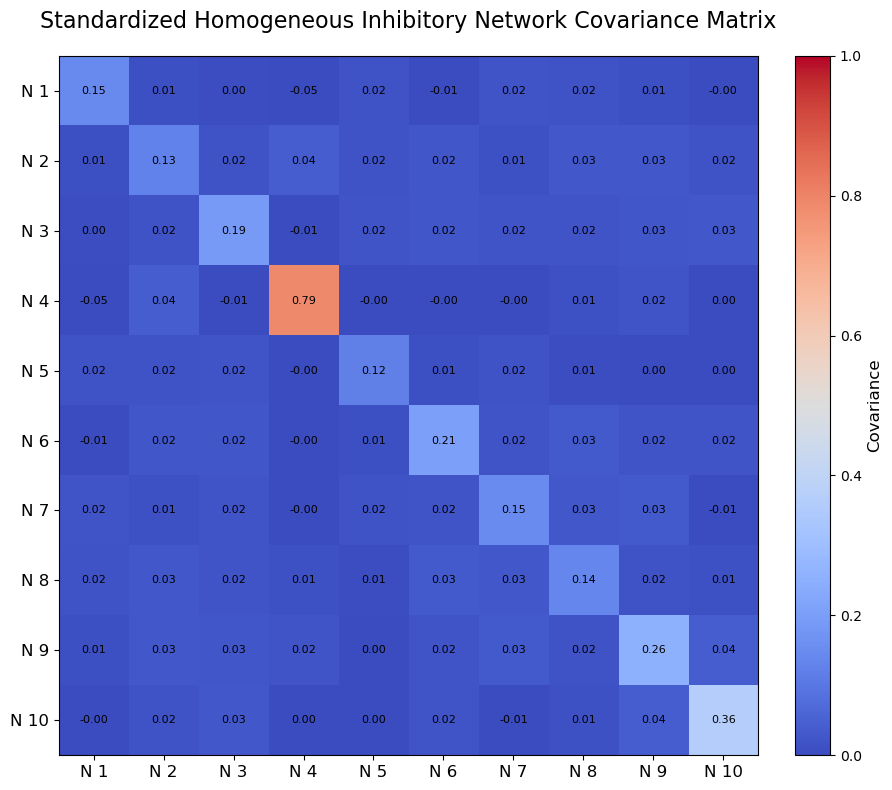

In [114]:
plot_covariance_matrix(cov_matrix_in, normalize=False, title="Standardized Homogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.50531949e-01,  1.03650799e-02,  4.55102433e-03,
        -4.62910752e-02,  1.73426305e-02, -7.12131108e-03,
         1.93931314e-02,  1.69135712e-02,  9.40078185e-03,
        -1.37627871e-03],
       [ 1.03650799e-02,  1.26008407e-01,  1.73200484e-02,
         4.14998886e-02,  1.79481537e-02,  2.46651106e-02,
         1.34272619e-02,  2.90934885e-02,  2.79134343e-02,
         1.77988097e-02],
       [ 4.55102433e-03,  1.73200484e-02,  1.86246195e-01,
        -9.88602912e-03,  2.15338999e-02,  2.37798499e-02,
         2.19466457e-02,  2.12541537e-02,  2.54957284e-02,
         3.11804948e-02],
       [-4.62910752e-02,  4.14998886e-02, -9.88602912e-03,
         6.99293914e-01, -6.36377540e-04, -1.28800648e-03,
        -3.22298882e-03,  1.29254249e-02,  1.70752386e-02,
         9.52516854e-04],
       [ 1.73426305e-02,  1.79481537e-02,  2.15338999e-02,
        -6.36377540e-04,  1.23490245e-01,  9.87011984e-03,
         1.93667733e-02,  4.94181807e-03,  1.99437028e-03,
         2.

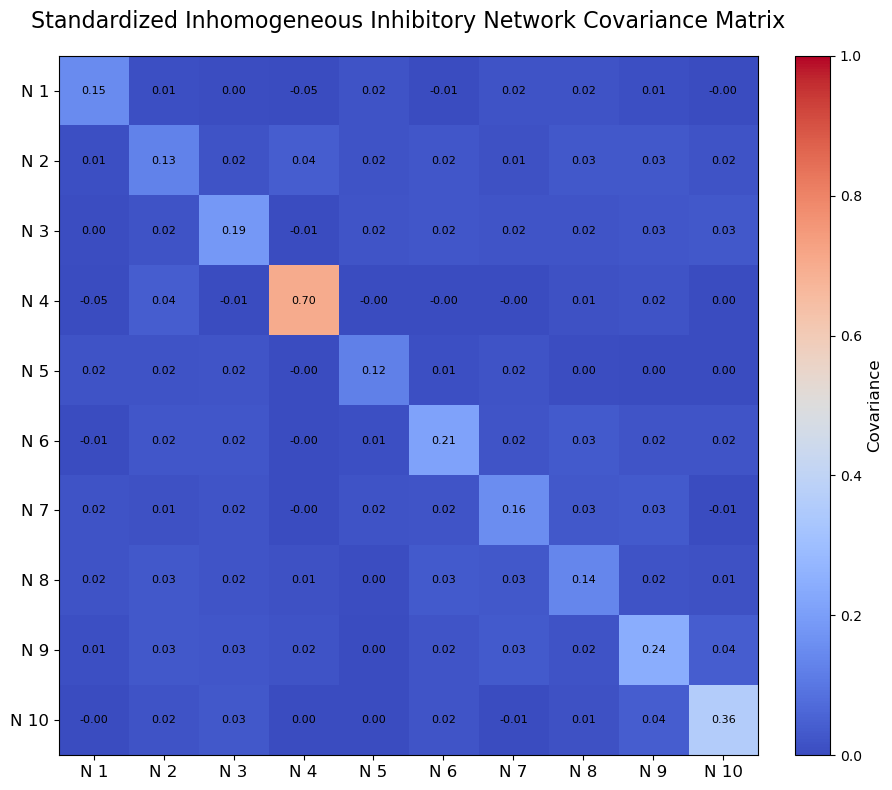

In [115]:
plot_covariance_matrix(cov_matrix_in_emp, normalize=False, title="Standardized Inhomogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [116]:
#hotelling_result_in = hotelling_t2_test(reshaped_stands_in, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in)
#hotelling_result_in_emp = hotelling_t2_test(reshaped_stands_in_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in_emp)

In [117]:
#cov_matrix_in, diagonal_ones_in = covariance_diagonal(reshaped_stands_in, tol=1e-8)
#print(cov_matrix_in)
#print(diagonal_ones_in)
#cov_matrix_in_emp, diagonal_ones_in_emp = covariance_diagonal(reshaped_stands_in_emp, tol=1e-8)
#print(cov_matrix_in_emp)
#print(diagonal_ones_in_emp)

In [118]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_in = multivariate_normal(mean = theoretical_means_sim_in, cov = cov_matrix_in, allow_singular=allow_singular)
# rv_in_emp = multivariate_normal(mean = empirical_mean_in, cov = cov_matrix_in_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

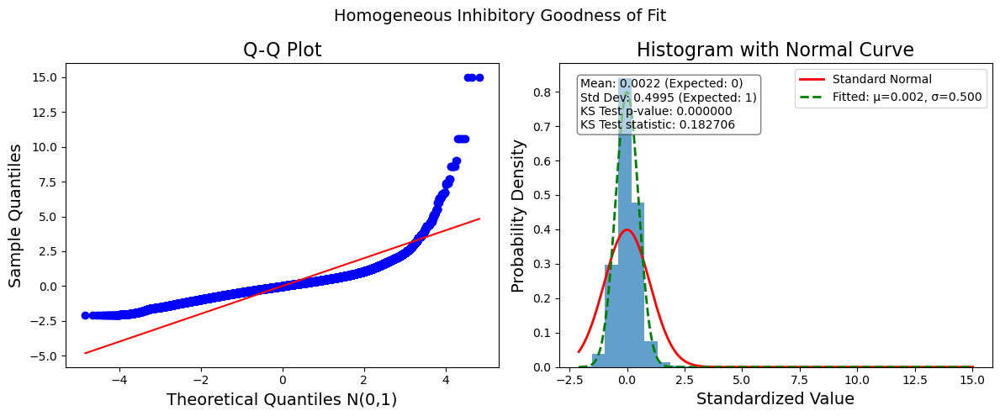

In [119]:
goodness_in, fig_in = analyze_poisson_goodness_of_fit(serialized_count_in, plot_title="Homogeneous Inhibitory Goodness of Fit", sample_limit=5000)

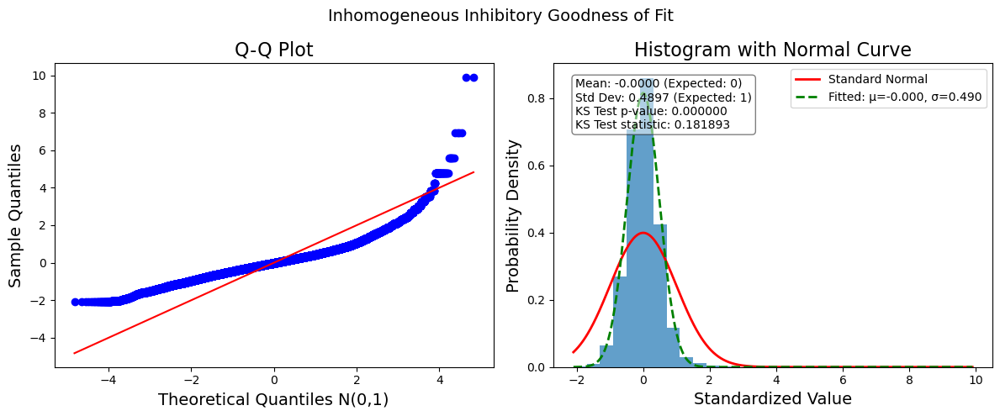

In [120]:
goodness_in_emp, fig_in_emp = analyze_poisson_goodness_of_fit(serialized_count_in_emp, plot_title="Inhomogeneous Inhibitory Goodness of Fit", sample_limit=5000)

Balanced Excitatory and Inhibitory Experiments

In [122]:
# Original excitatory and inhibitory data shapes
print(reshaped_stands_ex.shape)
print(reshaped_stands_in.shape)

print(reshaped_stands_ex_emp.shape)
print(reshaped_stands_in_emp.shape)

(10, 99900)
(10, 99900)
(10, 99900)
(10, 99900)


In [123]:
balanced_data, labels, types = create_balanced_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nBalanced dataset shape: {balanced_data.shape}")
print(f"Neuron labels: {labels}")
print(f"Neuron types: {types}")

balanced_data_emp, labels_emp, types_emp = create_balanced_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nBalanced Empirical dataset shape: {balanced_data_emp.shape}")
print(f"Neuron Empirical labels: {labels_emp}")
print(f"Neuron Empirical types: {types_emp}")


Balanced dataset shape: (10, 99900)
Neuron labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']

Balanced Empirical dataset shape: (10, 99900)
Neuron Empirical labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron Empirical types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']


In [124]:
cov_matrix_balance = cov_standardized_data(balanced_data)
cov_matrix_balance_emp = cov_standardized_data(balanced_data_emp)

array([[ 1.35792646e-01,  2.91982299e-02,  2.39233347e-02,
         3.32965700e-02,  2.12388922e-02,  2.33491666e-02,
         1.86696206e-02,  4.25182598e-02, -2.83650998e-02,
         3.43066447e-02],
       [ 2.91982299e-02,  1.30178615e-01,  1.16663648e-02,
         1.77195144e-02,  1.48541998e-02,  2.17145467e-02,
         1.10211001e-02,  3.13954130e-02,  9.18291335e-03,
         3.90012478e-02],
       [ 2.39233347e-02,  1.16663648e-02,  2.76426380e-01,
         2.90205954e-02,  3.03931323e-02, -4.58293390e-03,
         2.57651342e-02,  3.34946505e-02,  7.84782005e-02,
         1.84916737e-02],
       [ 3.32965700e-02,  1.77195144e-02,  2.90205954e-02,
         1.43277658e-01,  2.44955174e-02,  2.63764764e-02,
         2.06326437e-02,  9.56764620e-03,  1.41355838e-03,
         2.06577905e-02],
       [ 2.12388922e-02,  1.48541998e-02,  3.03931323e-02,
         2.44955174e-02,  1.43564280e-01,  1.00641984e-02,
         3.11130840e-02,  1.65862525e-02,  3.01966359e-02,
         2.

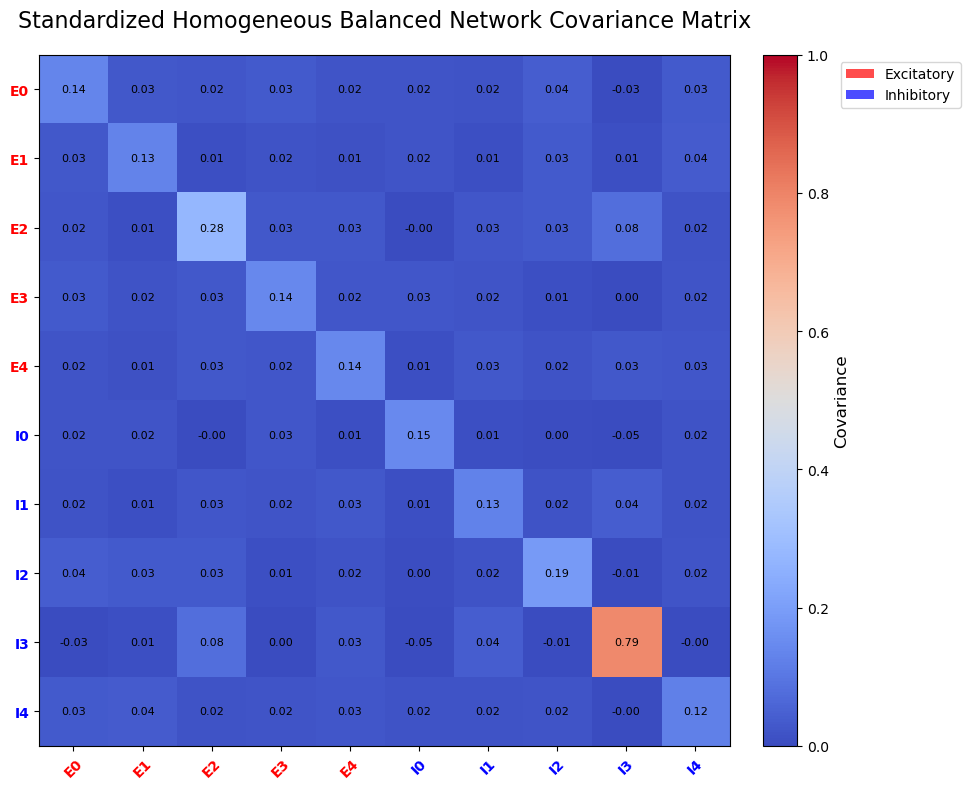

In [125]:
plot_covariance_matrix(cov_matrix_balance, normalize=False, title="Standardized Homogeneous Balanced Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels)

array([[ 1.36243986e-01,  2.87436506e-02,  2.39037945e-02,
         3.39074737e-02,  2.10765343e-02,  2.34244670e-02,
         1.83707580e-02,  4.18740257e-02, -2.83621811e-02,
         3.41611664e-02],
       [ 2.87436506e-02,  1.24140599e-01,  1.06989812e-02,
         1.84248011e-02,  1.45546247e-02,  2.20600336e-02,
         1.05701161e-02,  3.07380903e-02,  3.67037083e-03,
         3.82012881e-02],
       [ 2.39037945e-02,  1.06989812e-02,  2.67320077e-01,
         2.93157029e-02,  3.00370788e-02, -4.35862281e-03,
         2.51851951e-02,  3.37085503e-02,  6.76325110e-02,
         1.84395025e-02],
       [ 3.39074737e-02,  1.84248011e-02,  2.93157029e-02,
         1.46408258e-01,  2.41777666e-02,  2.60322379e-02,
         2.09713947e-02,  9.66832331e-03,  3.07143586e-03,
         2.12144412e-02],
       [ 2.10765343e-02,  1.45546247e-02,  3.00370788e-02,
         2.41777666e-02,  1.41822972e-01,  9.89859922e-03,
         3.08468079e-02,  1.62467051e-02,  2.82634938e-02,
         2.

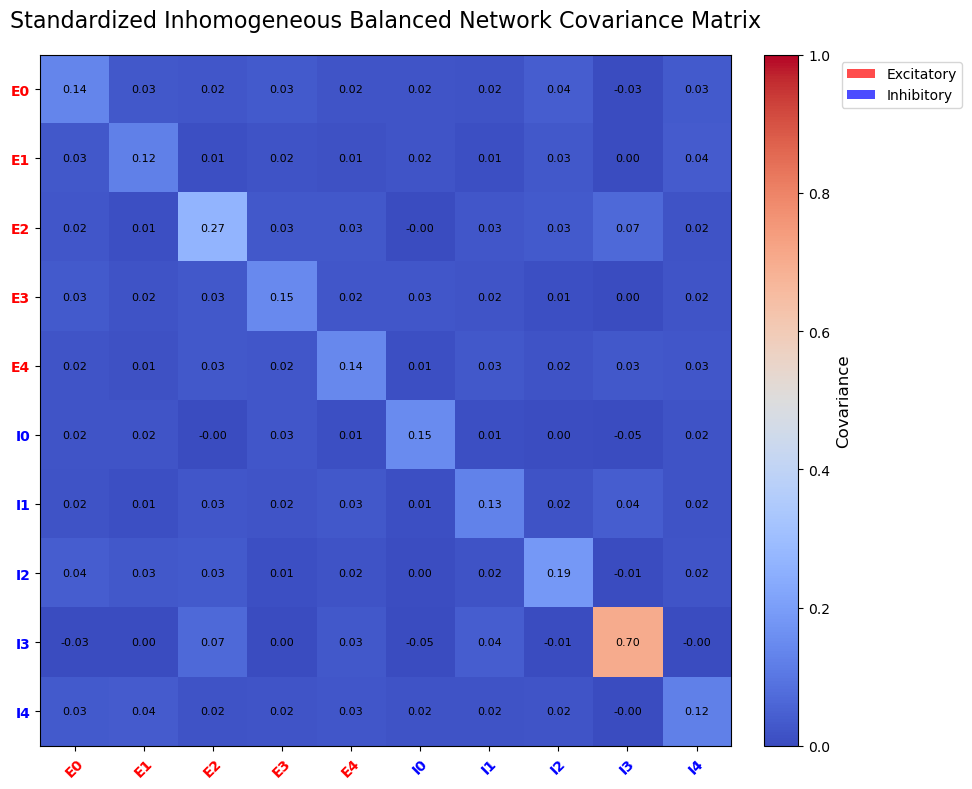

In [126]:
plot_covariance_matrix(cov_matrix_balance_emp, normalize=False, title="Standardized Inhomogeneous Balanced Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels_emp)

In [127]:
interleaved_data, int_labels, int_types = create_interleaved_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nInterleaved dataset shape: {interleaved_data.shape}")
print(f"Neuron labels: {int_labels}")
print(f"Neuron types: {int_types}")

interleaved_data_emp, int_labels_emp, int_types_emp = create_interleaved_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nInterleaved Empirical dataset shape: {interleaved_data_emp.shape}")
print(f"Neuron Empirical labels: {int_labels_emp}")
print(f"Neuron Empirical types: {int_types_emp}")


Interleaved dataset shape: (10, 99900)
Neuron labels: ['E0', 'I0', 'E1', 'I1', 'E2', 'I2', 'E3', 'I3', 'E4', 'I4']
Neuron types: ['E', 'I', 'E', 'I', 'E', 'I', 'E', 'I', 'E', 'I']

Interleaved Empirical dataset shape: (10, 99900)
Neuron Empirical labels: ['E0', 'I0', 'E1', 'I1', 'E2', 'I2', 'E3', 'I3', 'E4', 'I4']
Neuron Empirical types: ['E', 'I', 'E', 'I', 'E', 'I', 'E', 'I', 'E', 'I']


In [128]:
cov_matrix_interleaved = cov_standardized_data(interleaved_data)
cov_matrix_interleaved_emp = cov_standardized_data(interleaved_data_emp)

array([[ 1.35792646e-01,  2.33491666e-02,  2.91982299e-02,
         1.86696206e-02,  2.39233347e-02,  4.25182598e-02,
         3.32965700e-02, -2.83650998e-02,  2.12388922e-02,
         3.43066447e-02],
       [ 2.33491666e-02,  1.47385330e-01,  2.17145467e-02,
         1.02749204e-02, -4.58293390e-03,  4.42323128e-03,
         2.63764764e-02, -4.86955715e-02,  1.00641984e-02,
         1.74908138e-02],
       [ 2.91982299e-02,  2.17145467e-02,  1.30178615e-01,
         1.10211001e-02,  1.16663648e-02,  3.13954130e-02,
         1.77195144e-02,  9.18291335e-03,  1.48541998e-02,
         3.90012478e-02],
       [ 1.86696206e-02,  1.02749204e-02,  1.10211001e-02,
         1.28077667e-01,  2.57651342e-02,  1.78625719e-02,
         2.06326437e-02,  4.03552288e-02,  3.11130840e-02,
         1.85502519e-02],
       [ 2.39233347e-02, -4.58293390e-03,  1.16663648e-02,
         2.57651342e-02,  2.76426380e-01,  3.34946505e-02,
         2.90205954e-02,  7.84782005e-02,  3.03931323e-02,
         1.

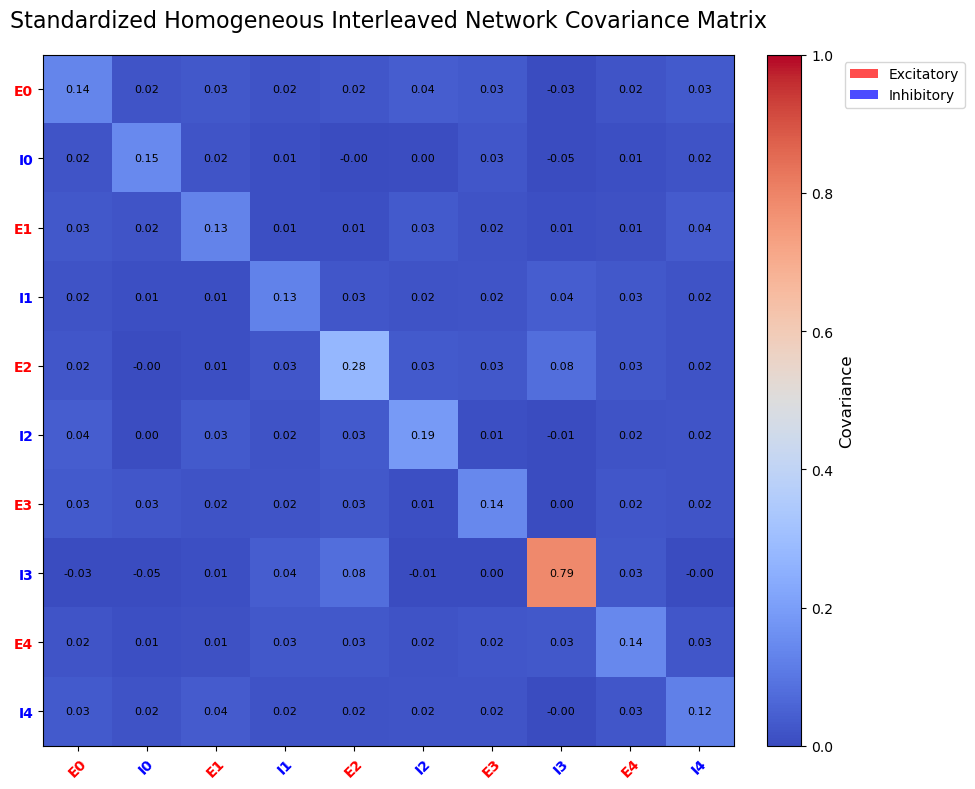

In [129]:
plot_covariance_matrix(cov_matrix_interleaved, normalize=False, title="Standardized Homogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels)

array([[ 1.36243986e-01,  2.34244670e-02,  2.87436506e-02,
         1.83707580e-02,  2.39037945e-02,  4.18740257e-02,
         3.39074737e-02, -2.83621811e-02,  2.10765343e-02,
         3.41611664e-02],
       [ 2.34244670e-02,  1.50531949e-01,  2.20600336e-02,
         1.03650799e-02, -4.35862281e-03,  4.55102433e-03,
         2.60322379e-02, -4.62910752e-02,  9.89859922e-03,
         1.73426305e-02],
       [ 2.87436506e-02,  2.20600336e-02,  1.24140599e-01,
         1.05701161e-02,  1.06989812e-02,  3.07380903e-02,
         1.84248011e-02,  3.67037083e-03,  1.45546247e-02,
         3.82012881e-02],
       [ 1.83707580e-02,  1.03650799e-02,  1.05701161e-02,
         1.26008407e-01,  2.51851951e-02,  1.73200484e-02,
         2.09713947e-02,  4.14998886e-02,  3.08468079e-02,
         1.79481537e-02],
       [ 2.39037945e-02, -4.35862281e-03,  1.06989812e-02,
         2.51851951e-02,  2.67320077e-01,  3.37085503e-02,
         2.93157029e-02,  6.76325110e-02,  3.00370788e-02,
         1.

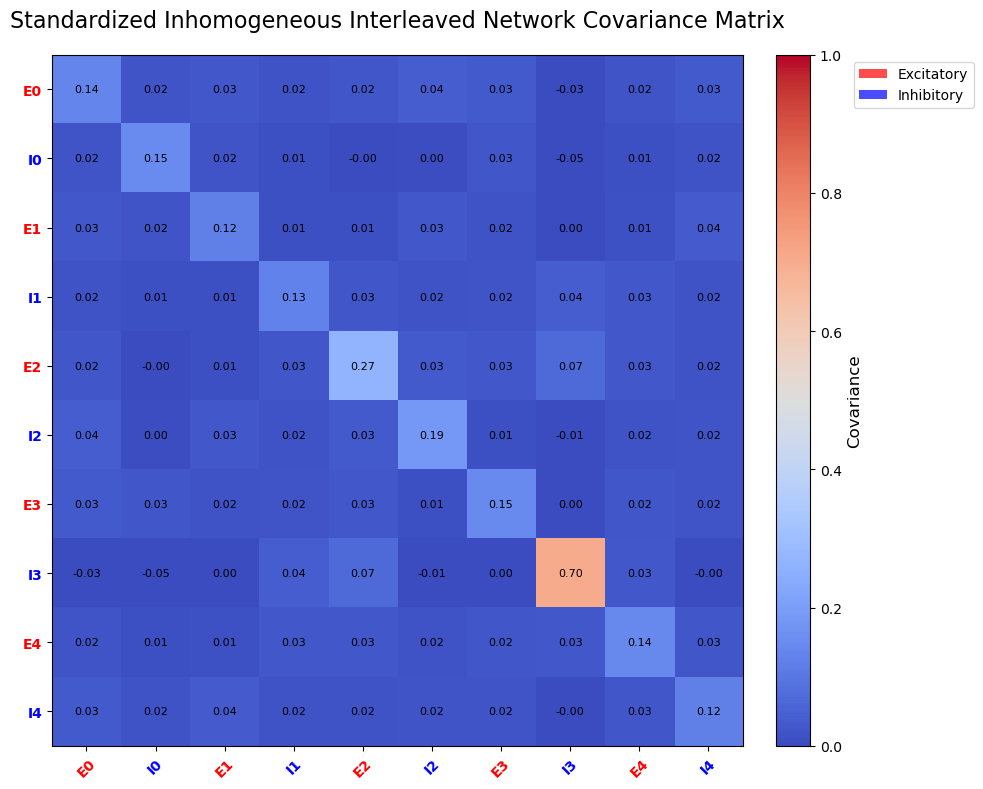

In [130]:
plot_covariance_matrix(cov_matrix_interleaved_emp, normalize=False, title="Standardized Inhomogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels_emp)

In [131]:
random_data, rand_labels, rand_types = create_random_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nRandom dataset shape: {random_data.shape}")
print(f"Neuron labels: {rand_labels}")
print(f"Neuron types: {rand_types}")

random_data_emp, rand_labels_emp, rand_types_emp = create_random_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nRandom Empirical dataset shape: {random_data_emp.shape}")
print(f"Neuron Empirical labels: {rand_labels_emp}")
print(f"Neuron Empirical types: {rand_types_emp}")


Random dataset shape: (10, 99900)
Neuron labels: ['I3', 'E5', 'E8', 'I1', 'I5', 'I0', 'E0', 'I8', 'E1', 'E7']
Neuron types: ['I', 'E', 'E', 'I', 'I', 'I', 'E', 'I', 'E', 'E']

Random Empirical dataset shape: (10, 99900)
Neuron Empirical labels: ['I3', 'E5', 'E8', 'I1', 'I5', 'I0', 'E0', 'I8', 'E1', 'E7']
Neuron Empirical types: ['I', 'E', 'E', 'I', 'I', 'I', 'E', 'I', 'E', 'E']


In [132]:
cov_matrix_random = cov_standardized_data(random_data)
cov_matrix_random_emp = cov_standardized_data(random_data_emp)

array([[ 0.7857763 , -0.03151849,  0.00578667,  0.04035523, -0.00178117,
        -0.04869557, -0.0283651 ,  0.02058969,  0.00918291,  0.02489199],
       [-0.03151849,  0.20779159,  0.03788296,  0.03109881,  0.0284425 ,
         0.023179  ,  0.03458237,  0.04231539,  0.03188008,  0.02661045],
       [ 0.00578667,  0.03788296,  0.17736737,  0.02885927,  0.0356328 ,
         0.0193393 ,  0.02542671,  0.01478922,  0.00362475,  0.03392271],
       [ 0.04035523,  0.03109881,  0.02885927,  0.12807767,  0.02468734,
         0.01027492,  0.01866962,  0.02895263,  0.0110211 ,  0.01982023],
       [-0.00178117,  0.0284425 ,  0.0356328 ,  0.02468734,  0.20631362,
        -0.00614712,  0.01849232,  0.02095435,  0.01800324,  0.04391558],
       [-0.04869557,  0.023179  ,  0.0193393 ,  0.01027492, -0.00614712,
         0.14738533,  0.02334917,  0.00905046,  0.02171455,  0.01621478],
       [-0.0283651 ,  0.03458237,  0.02542671,  0.01866962,  0.01849232,
         0.02334917,  0.13579265,  0.00313381

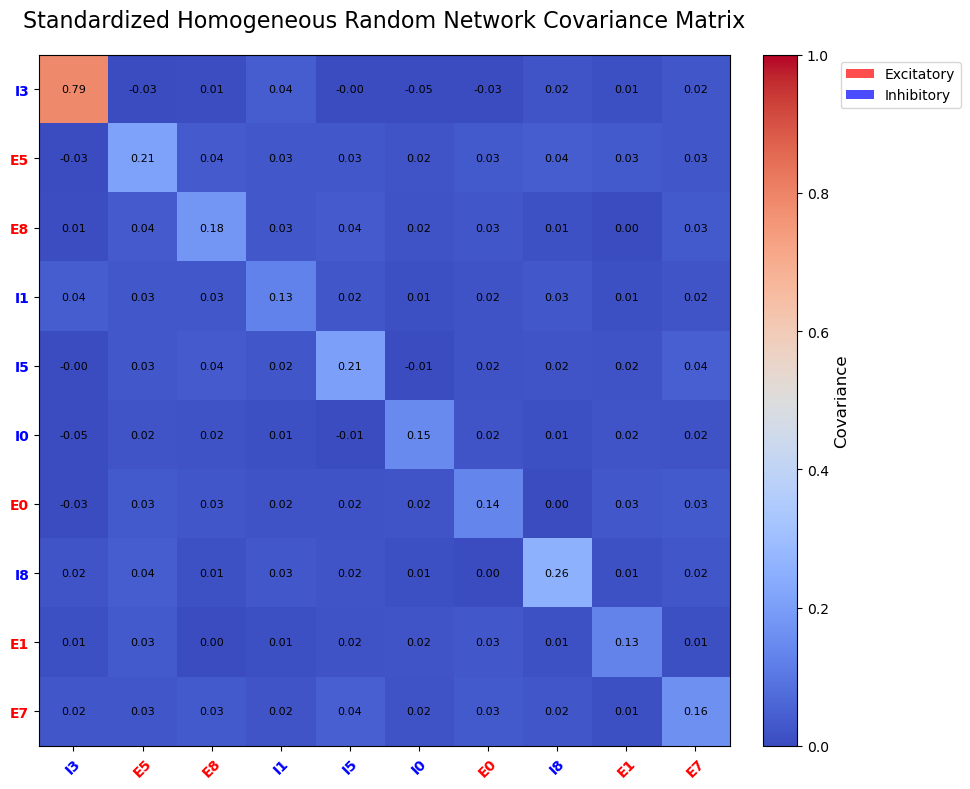

In [133]:
plot_covariance_matrix(cov_matrix_random, normalize=False, title="Standardized Homogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels)

array([[ 0.69929391, -0.03099028,  0.00573884,  0.04149989, -0.00128801,
        -0.04629108, -0.02836218,  0.01707524,  0.00367037,  0.0277817 ],
       [-0.03099028,  0.2098583 ,  0.03769489,  0.03136543,  0.02865498,
         0.02283242,  0.03468432,  0.04243441,  0.03190933,  0.02657938],
       [ 0.00573884,  0.03769489,  0.17565638,  0.02895854,  0.03570231,
         0.01914771,  0.02566499,  0.01460847,  0.00368307,  0.03377732],
       [ 0.04149989,  0.03136543,  0.02895854,  0.12600841,  0.02466511,
         0.01036508,  0.01837076,  0.02791343,  0.01057012,  0.0197693 ],
       [-0.00128801,  0.02865498,  0.03570231,  0.02466511,  0.21151411,
        -0.00712131,  0.01873544,  0.02197462,  0.01866073,  0.04346665],
       [-0.04629108,  0.02283242,  0.01914771,  0.01036508, -0.00712131,
         0.15053195,  0.02342447,  0.00940078,  0.02206003,  0.01561674],
       [-0.02836218,  0.03468432,  0.02566499,  0.01837076,  0.01873544,
         0.02342447,  0.13624399,  0.0022991 

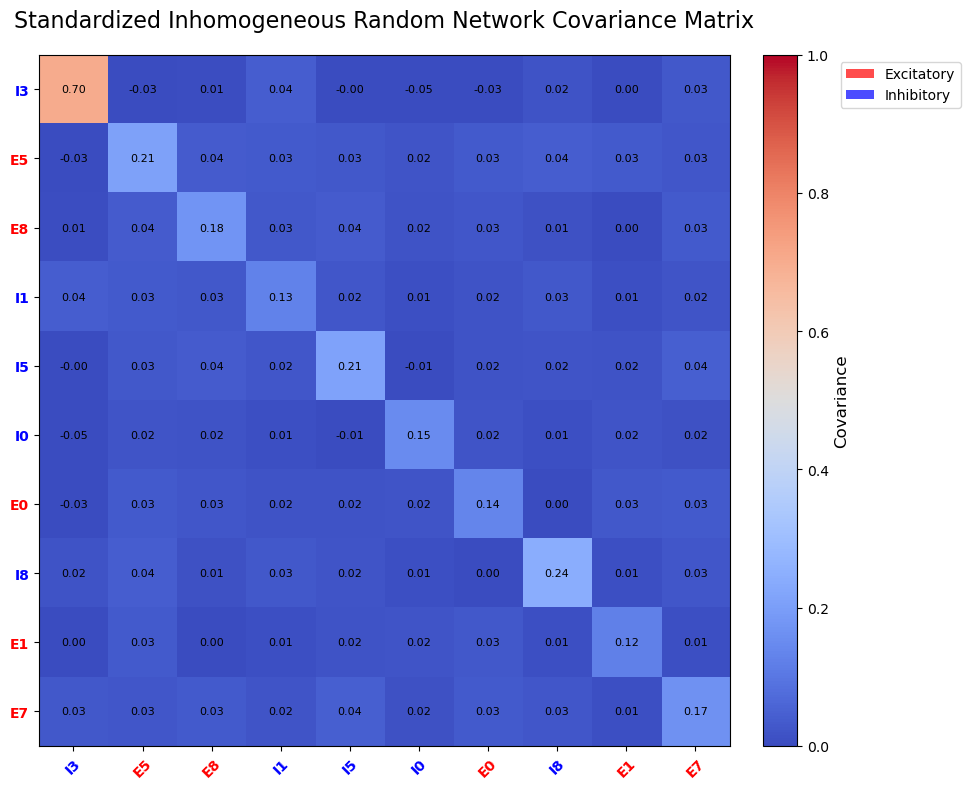

In [134]:
plot_covariance_matrix(cov_matrix_random_emp, normalize=False, title="Standardized Inhomogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels_emp)

Plots of raw counts, excitatory counts, and inhibitory counts centered and standardized.

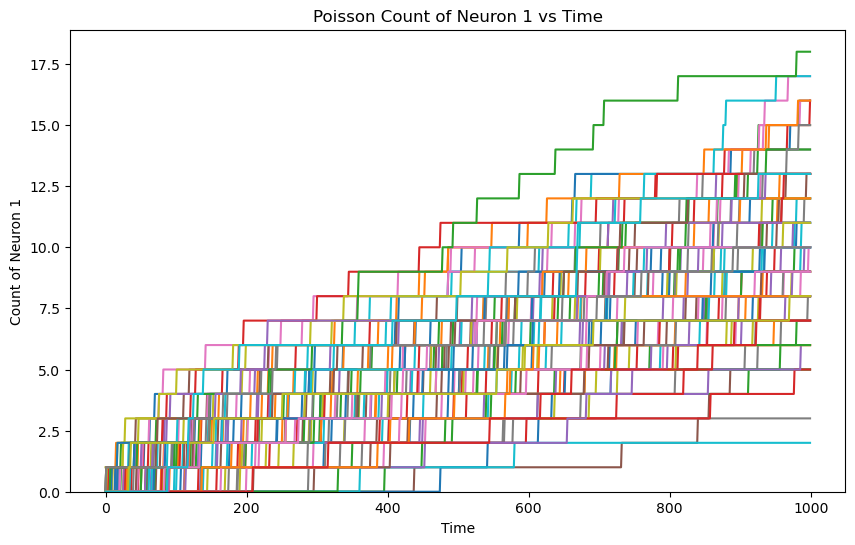

In [136]:
# plot_count_neuron1_vs_time(random_samples, num_samples = 5)
plot_count_neuron1_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Time')

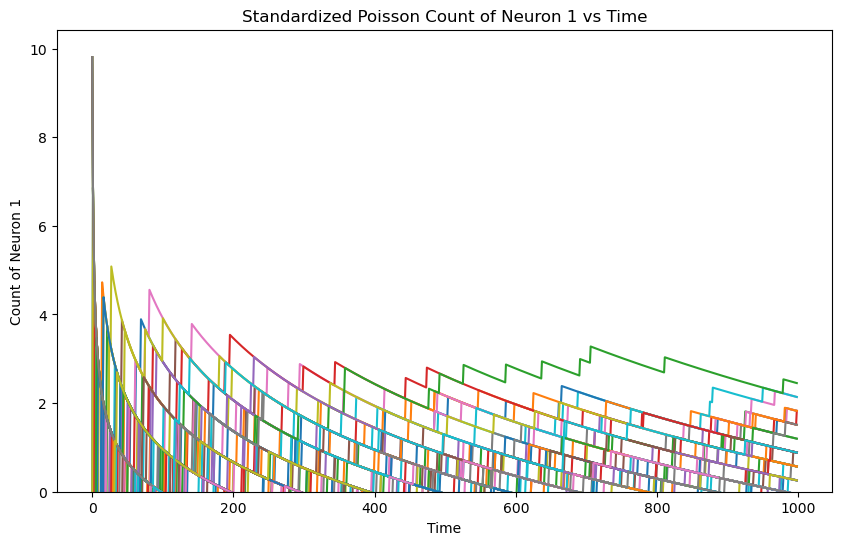

In [137]:
plot_count_neuron1_vs_time(stands, num_samples, title = 'Standardized Poisson Count of Neuron 1 vs Time')

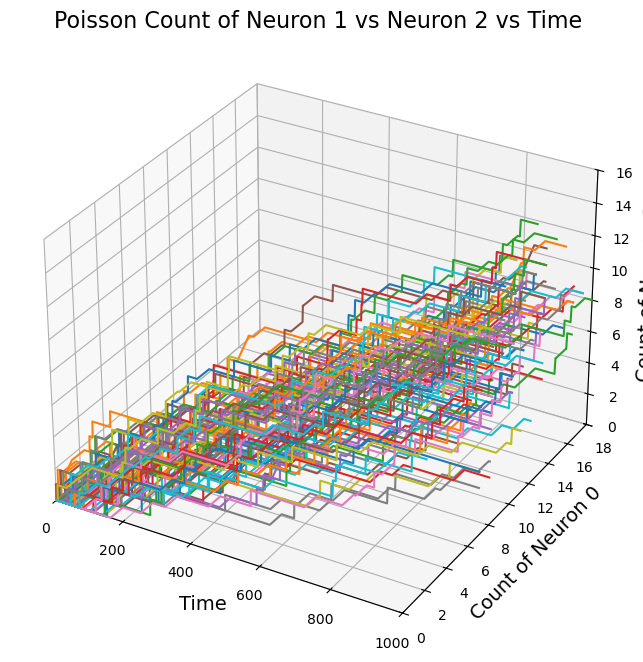

In [138]:
plot_count_neuron1_vs_neuron2_vs_time(count, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

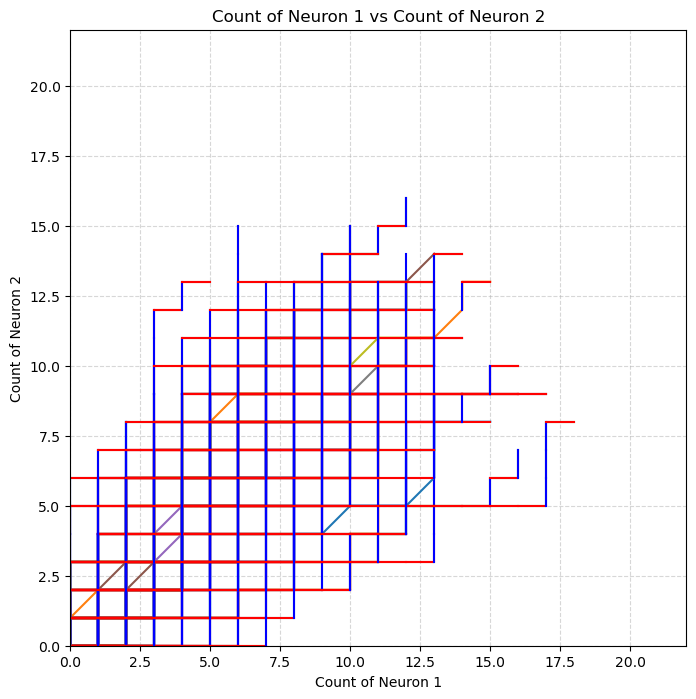

In [139]:
plot_count_neuron1_vs_count_neuron2(count, num_samples)

In [140]:
# plot_count_neuron1_vs_count_neuron2_vs_count_neuron3(count, num_samples)

In [141]:
# combined_poisson_plot(spike_train, count, theoretical_means, empirical_mean, colors=None, figsize=(12, 10))

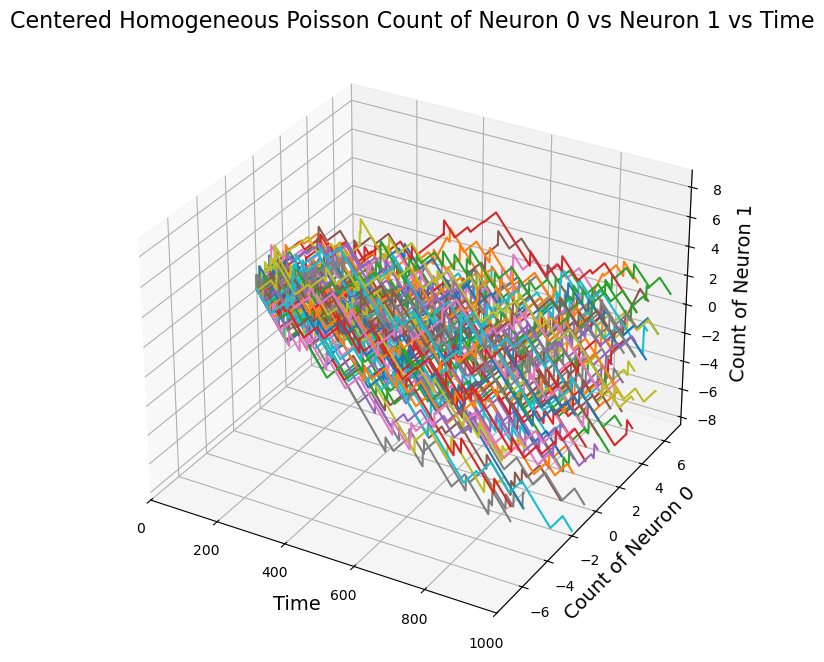

In [142]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time' )

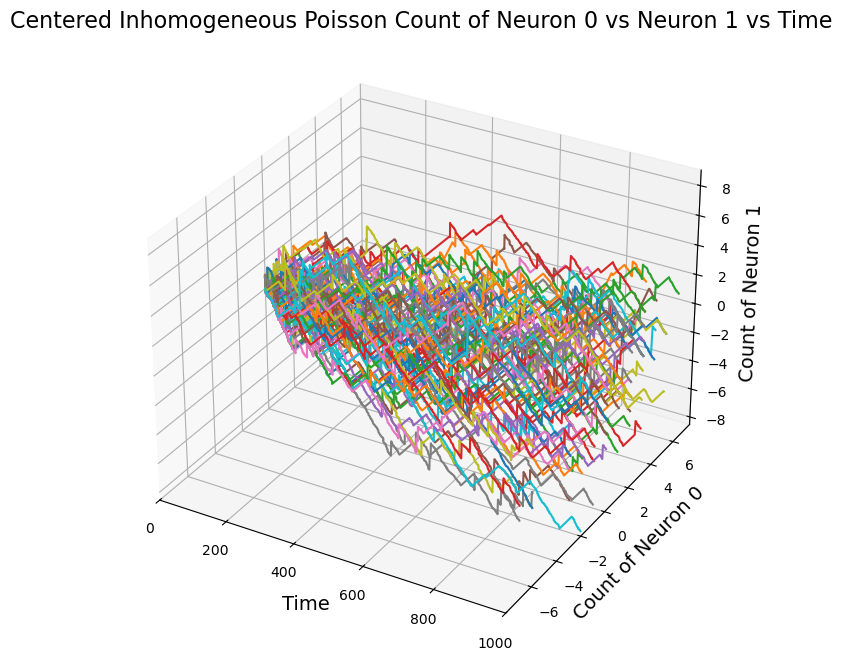

In [143]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:8: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neu

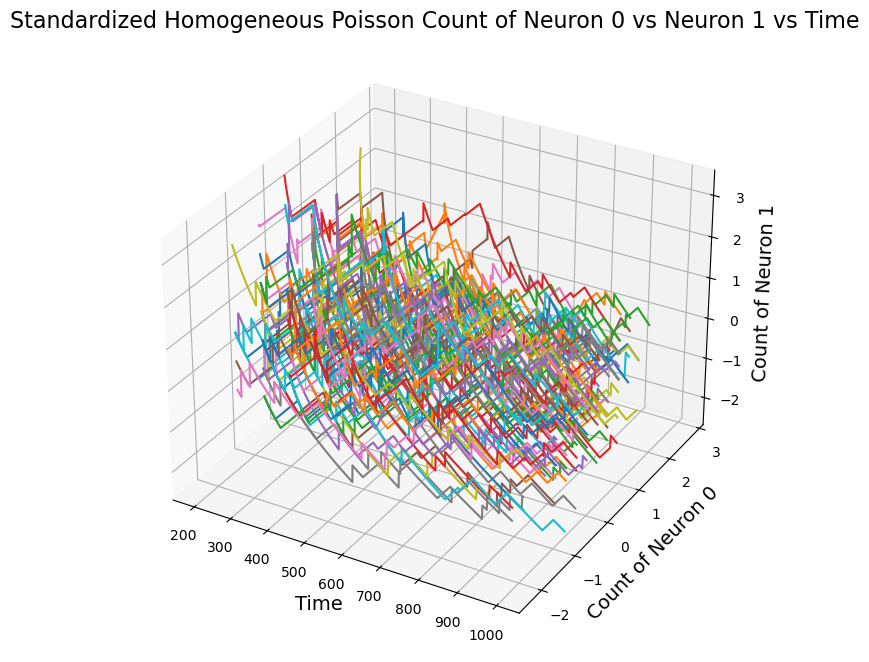

In [144]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

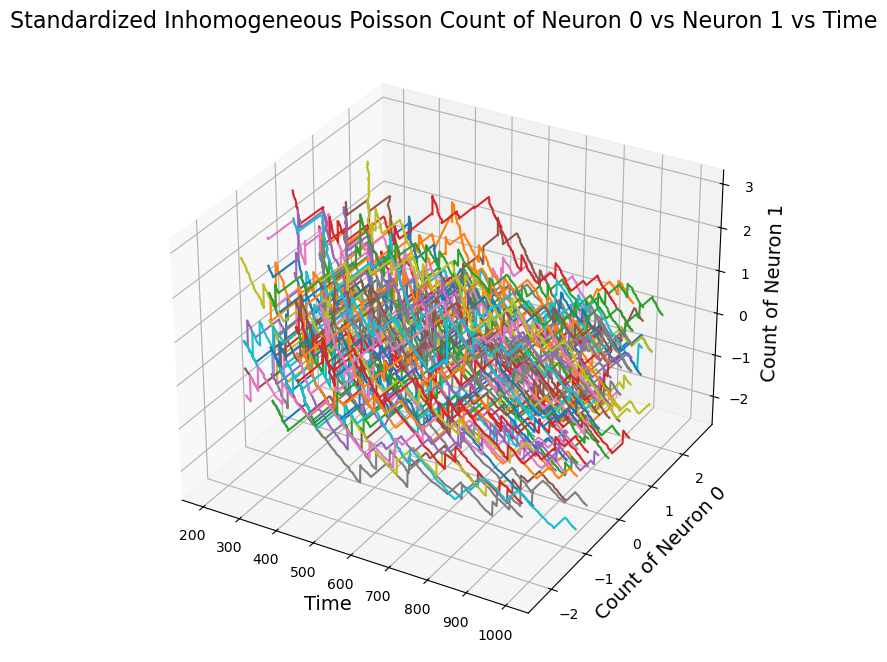

In [145]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

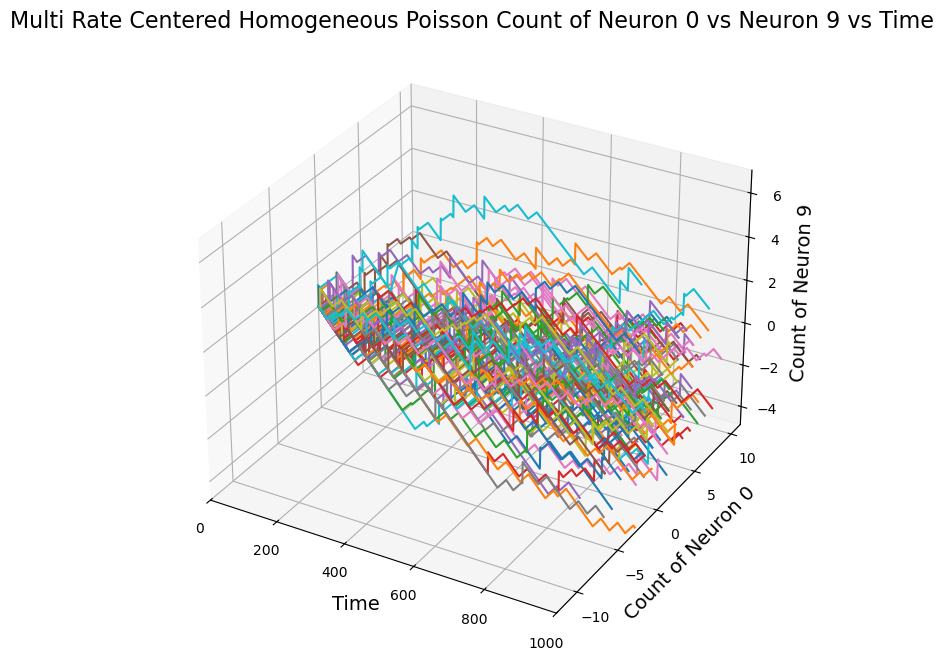

In [146]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

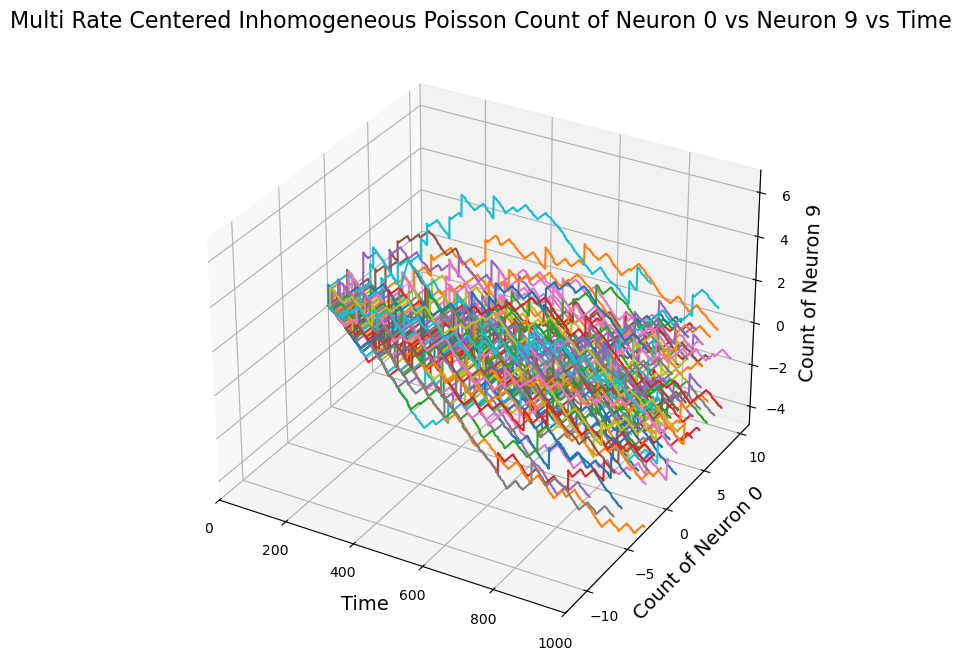

In [147]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:8: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]


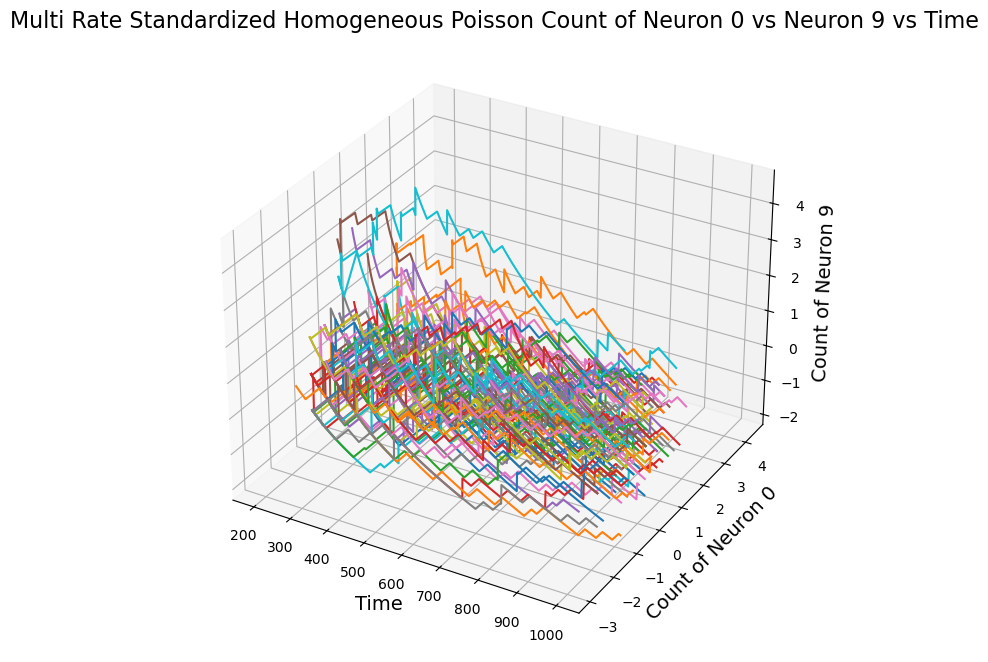

In [148]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


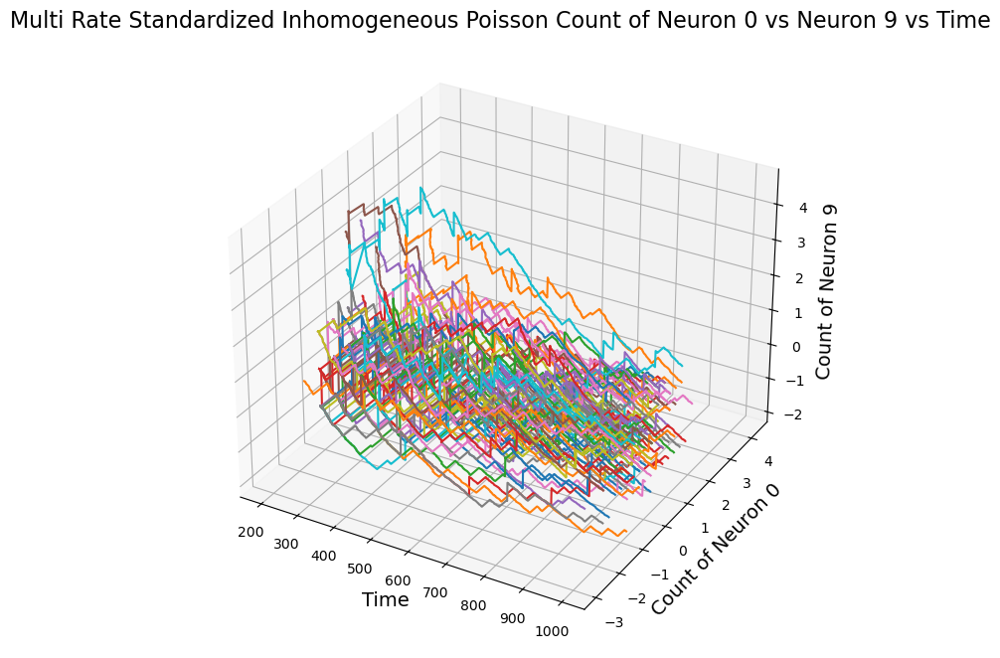

In [149]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

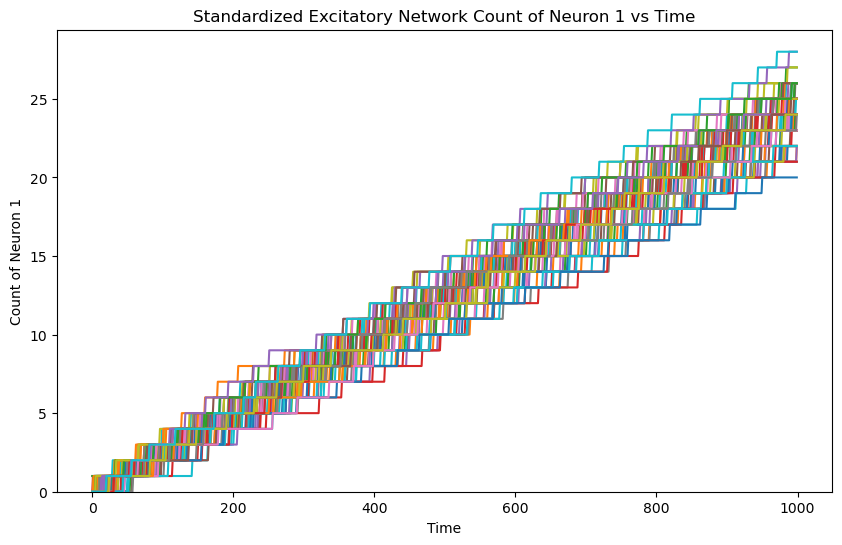

In [150]:
#plot_count_neuron1_vs_time(random_samples_ex, num_samples = 5)
plot_count_neuron1_vs_time(count_ex, num_samples, title = 'Standardized Excitatory Network Count of Neuron 1 vs Time')

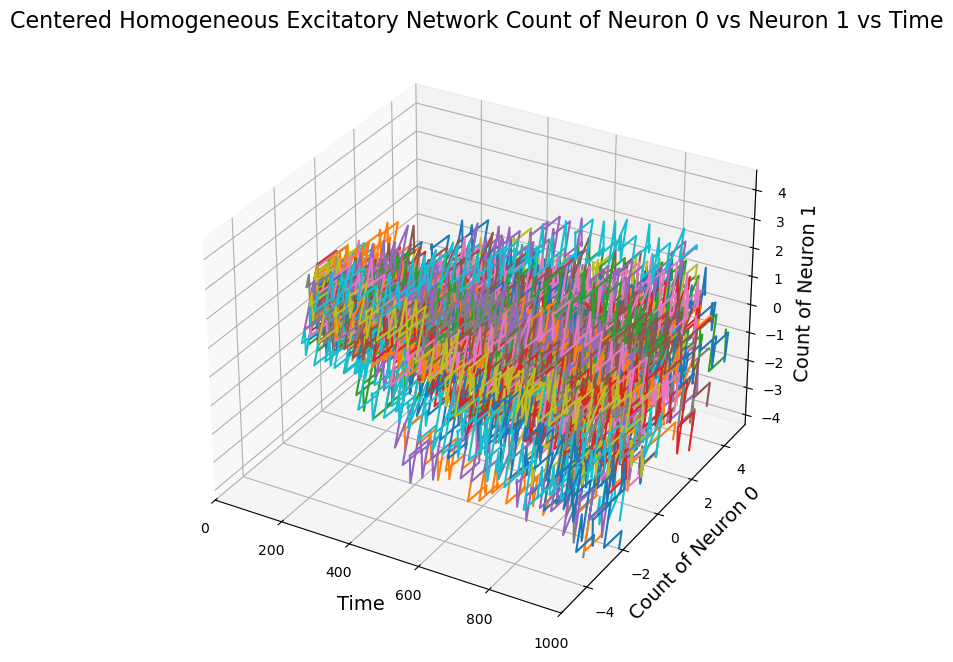

In [151]:
#plot_centered_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

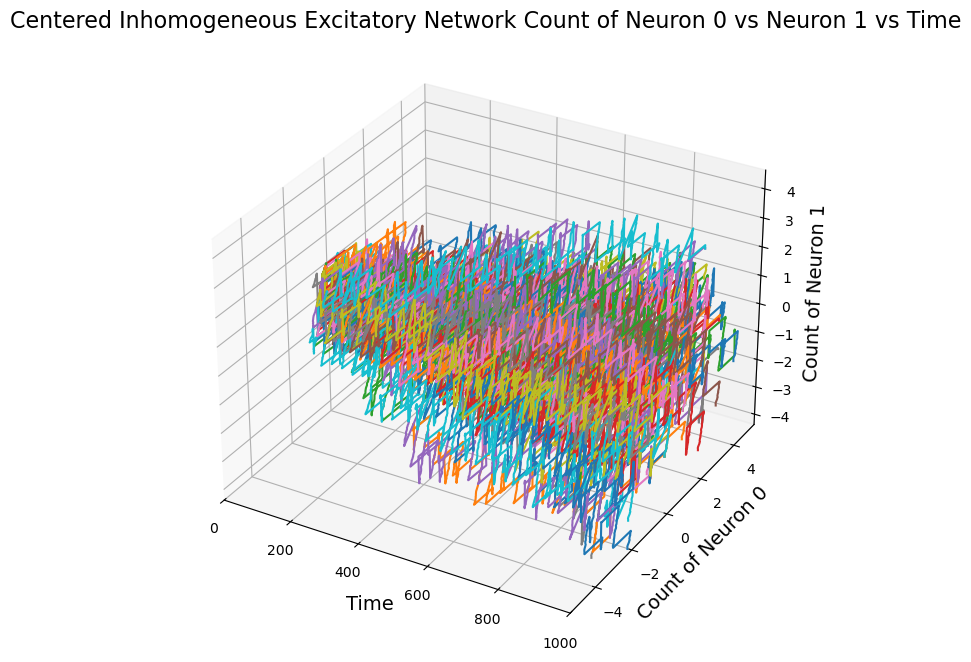

In [152]:
#plot_centered_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:8: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neu

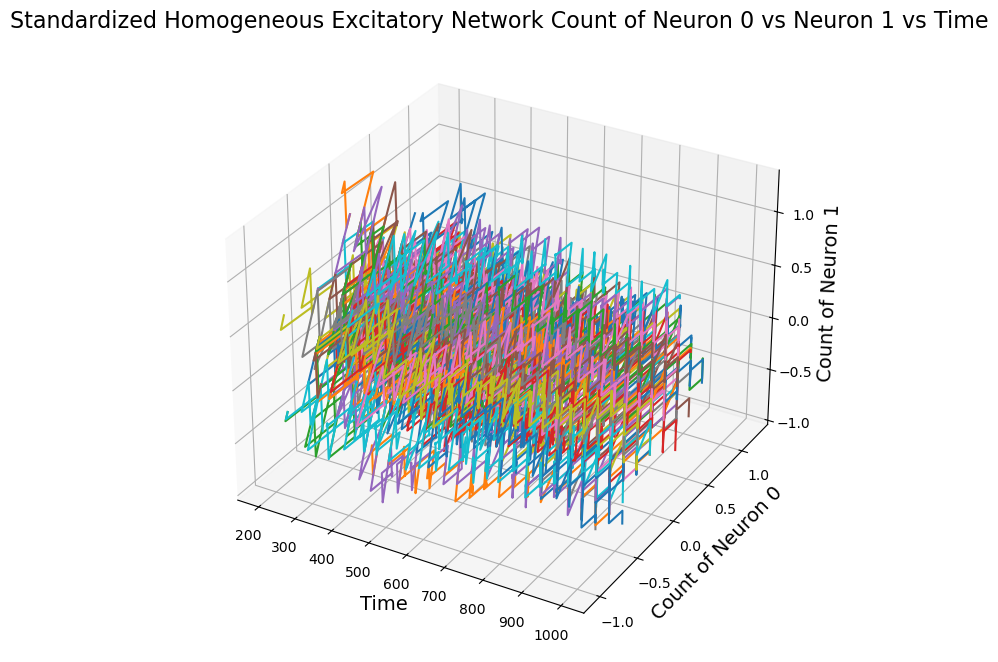

In [153]:
#plot_standardized_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

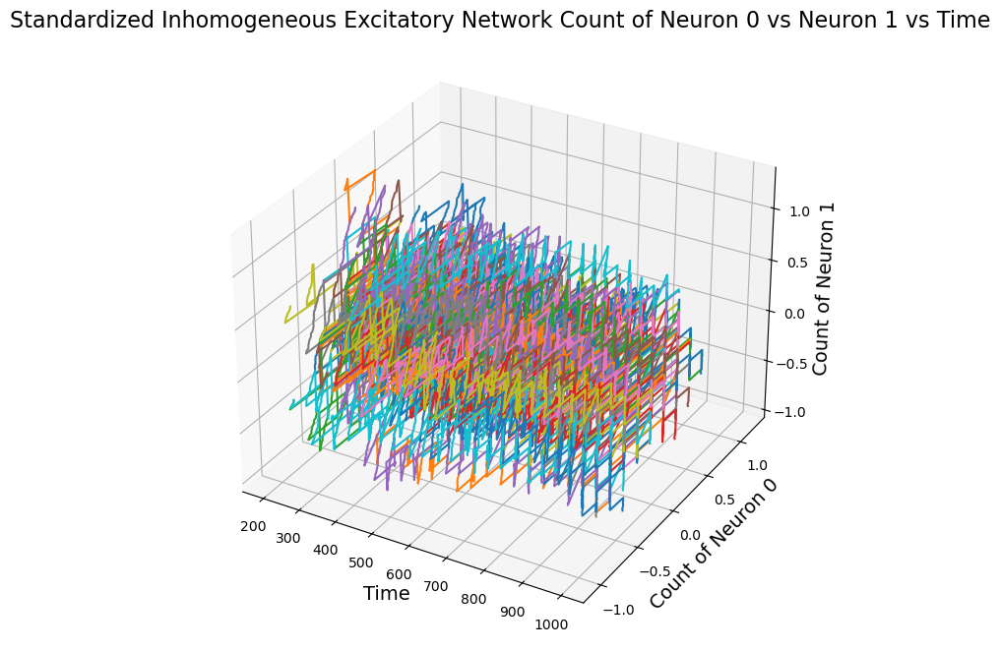

In [154]:
#plot_standardized_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

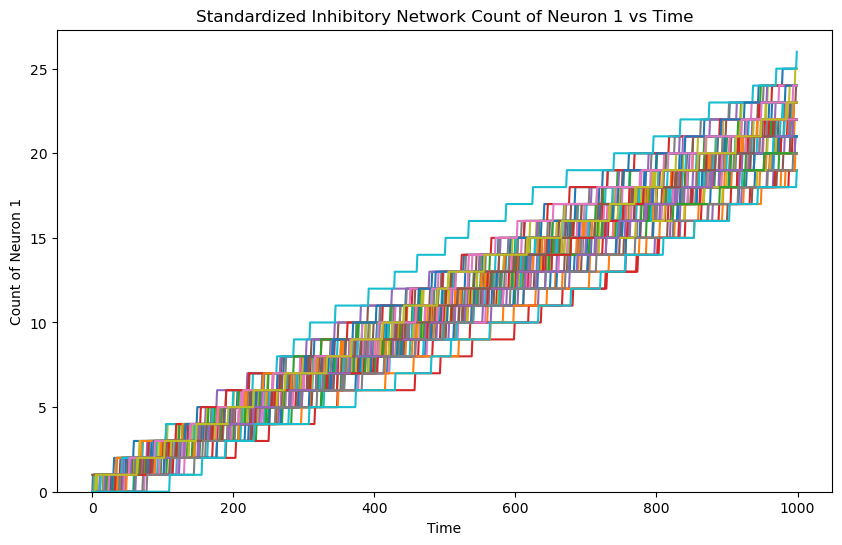

In [155]:
#plot_count_neuron1_vs_time(random_samples_in, num_samples = 5)
plot_count_neuron1_vs_time(count_in, num_samples, title = 'Standardized Inhibitory Network Count of Neuron 1 vs Time')

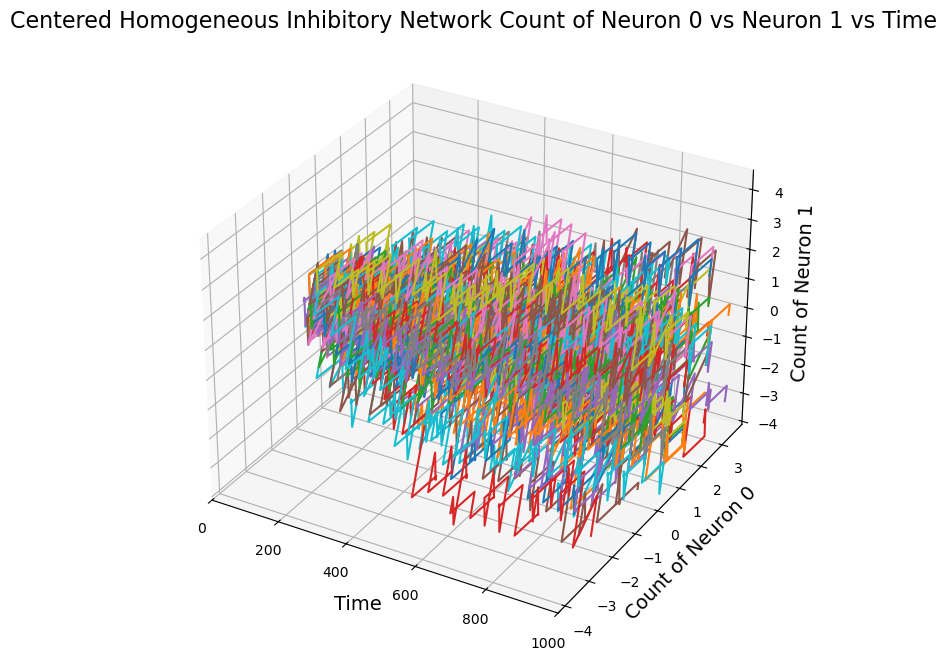

In [156]:
#plot_centered_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples= 5)
plot_centered_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

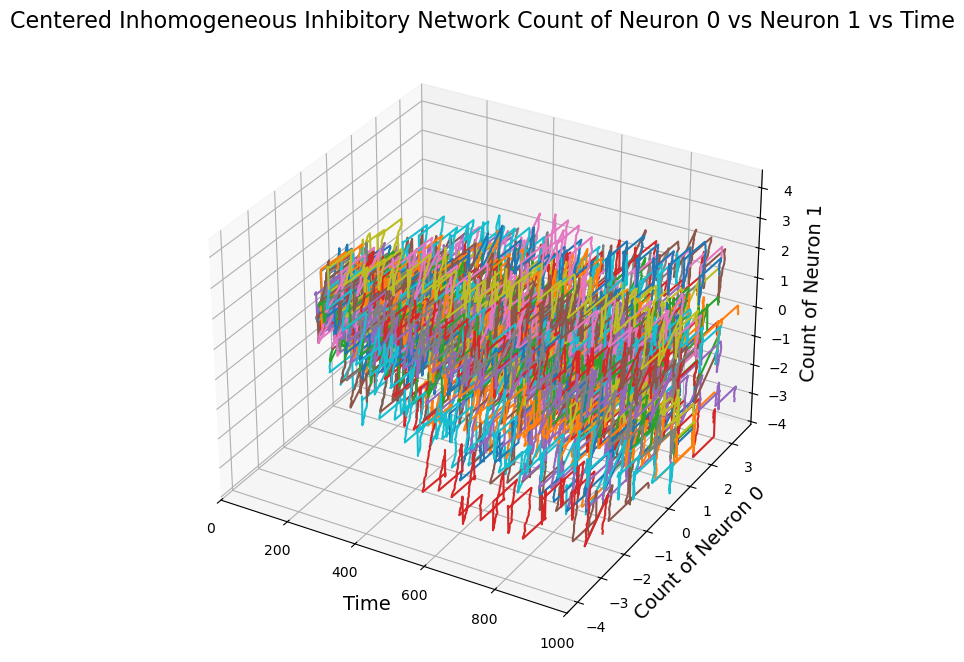

In [157]:
#plot_centered_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, num_samples= 5)
plot_centered_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:8: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:9: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:9: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\AppData\Local\Temp\ipykernel_41660\2676328115.py:8: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neu

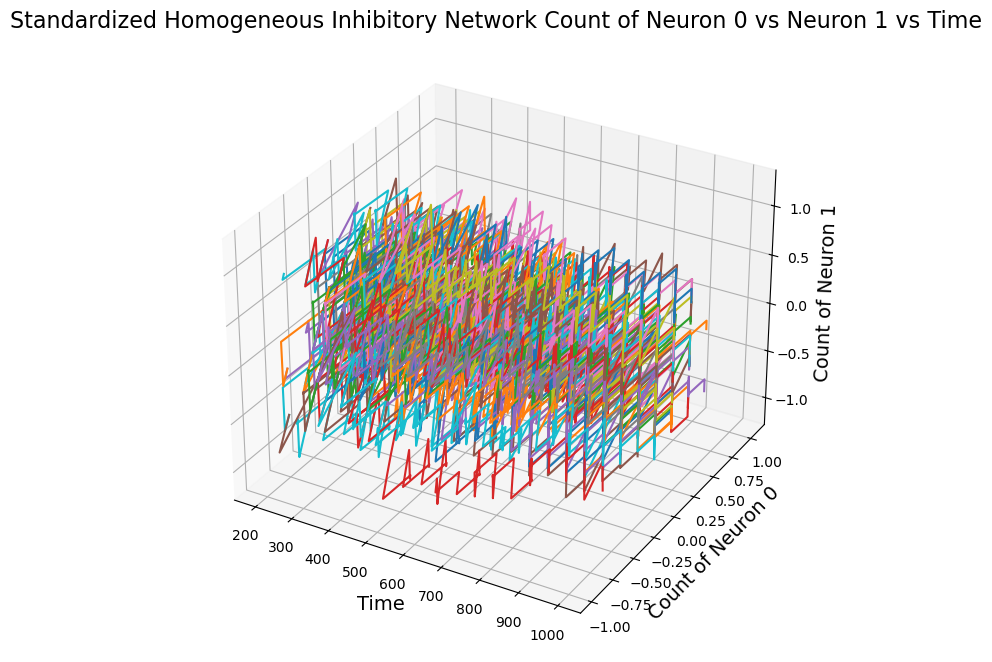

In [158]:
#plot_standardized_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

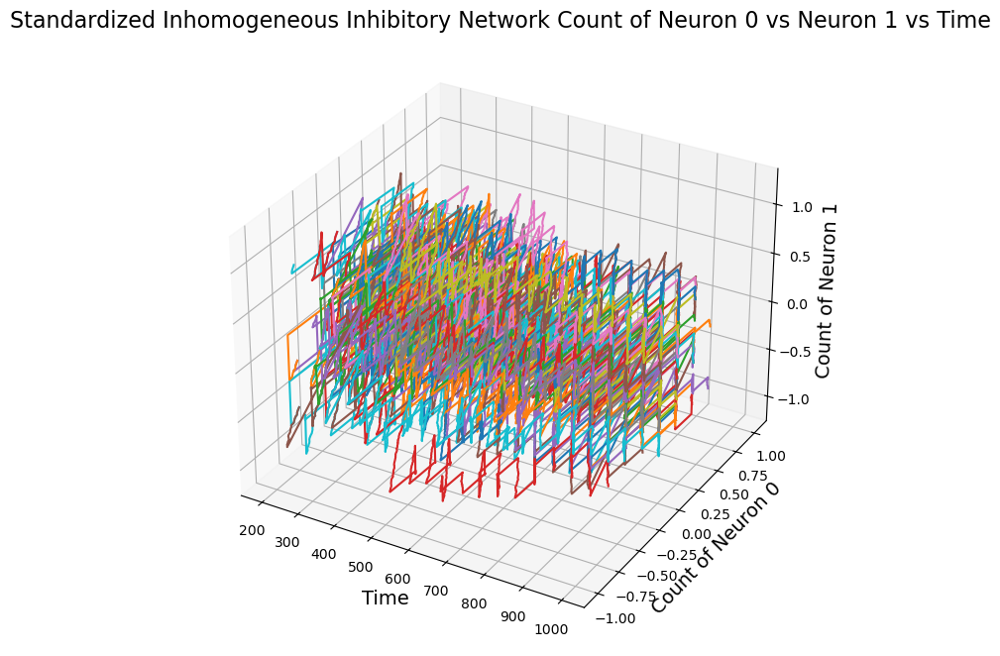

In [159]:
#plot_standardized_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Poisson Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

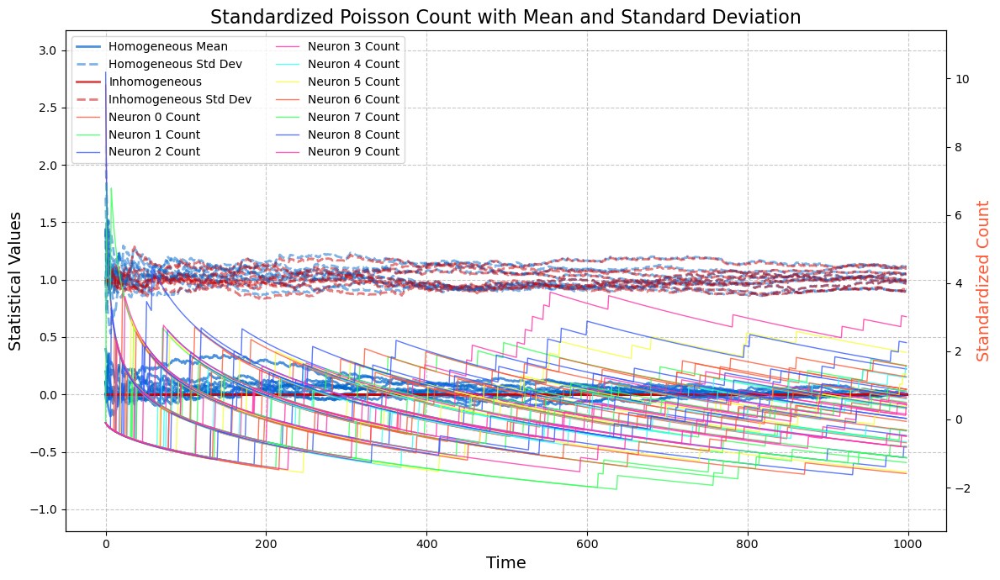

In [160]:
data_plot(stands, num_samples, standardized_mean, standardized_mean_emp, 
              standardized_std, standardized_std_emp, num_neurons, title= 'Standardized Poisson Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Exctitatory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

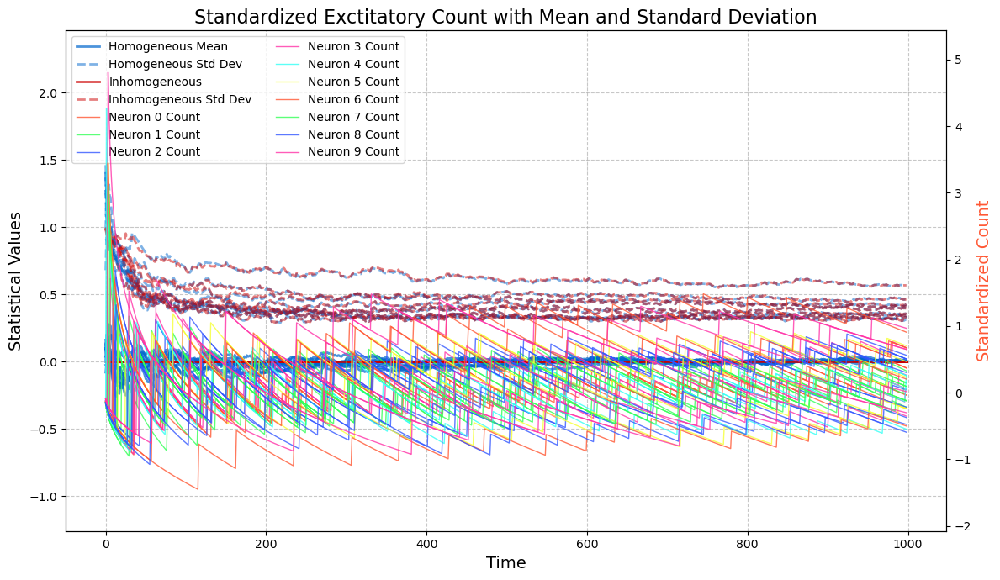

In [161]:
data_plot(stands_ex, num_samples, standardized_mean_ex, standardized_mean_ex_emp, 
              standardized_std_ex, standardized_std_ex_emp, num_neurons, title='Standardized Exctitatory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Inhibitory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

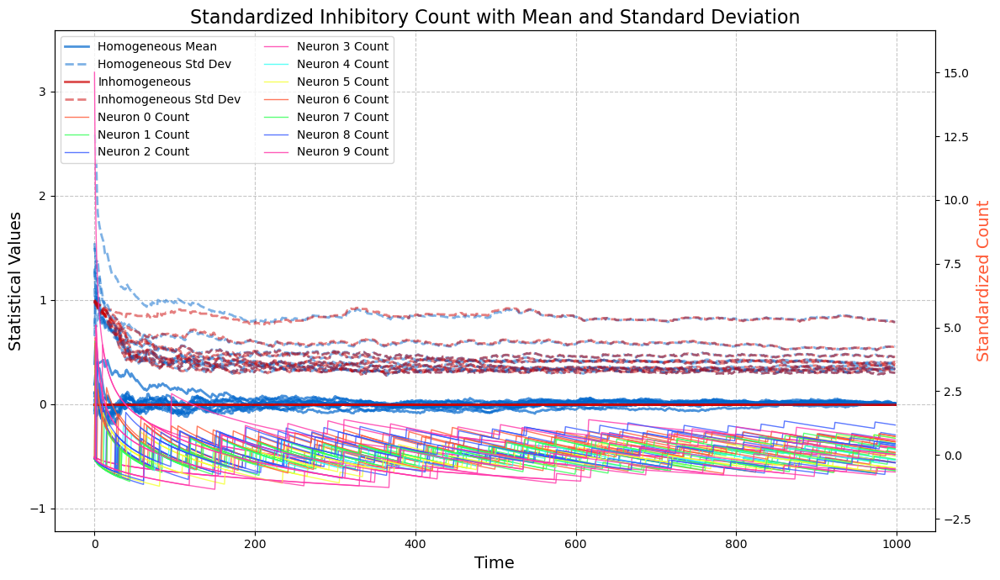

In [162]:
data_plot(stands_in, num_samples, standardized_mean_in, standardized_mean_in_emp, 
              standardized_std_in, standardized_std_in_emp, num_neurons, title='Standardized Inhibitory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)